# Libraries

In [1]:
%pip install dataframe_image
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import dataframe_image as dfi

Note: you may need to restart the kernel to use updated packages.


-----------------

# Dataset of food and agriculture divided in 13 different files

In [2]:
consumer_prices_indicators_data = pd.read_csv("Dataset/Consumer prices indicators - FAOSTAT_data_en_2-22-2024.csv")
crops_production_indicators_data =  pd.read_csv("Dataset/Crops production indicators - FAOSTAT_data_en_2-22-2024.csv")
emissions_data = pd.read_csv("Dataset/Emissions - FAOSTAT_data_en_2-27-2024.csv") 
employment_data = pd.read_csv("Dataset/Employment - FAOSTAT_data_en_2-27-2024.csv") 
exchange_rate_data = pd.read_csv("Dataset/Exchange rate - FAOSTAT_data_en_2-22-2024.csv") 
fertilizers_use_data = pd.read_csv("Dataset/Fertilizers use - FAOSTAT_data_en_2-27-2024.csv") 
food_balances_indicators_data = pd.read_csv("Dataset/Food balances indicators - FAOSTAT_data_en_2-22-2024.csv") 
food_security_indicators_data = pd.read_csv("Dataset/Food security indicators  - FAOSTAT_data_en_2-22-2024.csv") 
food_trade_indicators_data = pd.read_csv("Dataset/Food trade indicators - FAOSTAT_data_en_2-22-2024.csv") 
foreign_direct_investment_data = pd.read_csv("Dataset/Foreign direct investment - FAOSTAT_data_en_2-27-2024.csv") 
land_temperature_changes_data = pd.read_csv("Dataset/Land temperature change - FAOSTAT_data_en_2-27-2024.csv") 
land_use_data = pd.read_csv("Dataset/Land use - FAOSTAT_data_en_2-22-2024.csv") 
pesticides_use_data = pd.read_csv("Dataset/Pesticides use - FAOSTAT_data_en_2-27-2024.csv") 

C:\Users\luisl\AppData\Local\Temp\ipykernel_15636\1154432014.py:12: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  land_use_data = pd.read_csv("Dataset/Land use - FAOSTAT_data_en_2-22-2024.csv")


---

Due to the repetition of methodology for each file, at the end of the fourth file analysis I decided to make a function to extract all the minidatasets with the appropiate features of each one. Said function is shown below:

In [3]:
def extraction_features(dataset, element, months=False, how='inner'):
    features = dataset[f"{element}"].unique()
    
    minidatasets = []
    
    if months:
        for feature in features:
            new_dataset = dataset[dataset[element] == feature]
            annual_sums = new_dataset.groupby(["Year","Area"])['Value'].sum().reset_index()
            # Dropping 2023 row
            annual_sums_filtered = annual_sums[annual_sums['Year'] != 2023]
            annual_sums_filtered = annual_sums_filtered.rename(columns={'Value': feature})
            new_dataset_sum = annual_sums_filtered.groupby(['Area', 'Year'])[feature].sum().reset_index()

            minidatasets.append(new_dataset_sum)
            
    else:
        for feature in features:
            new_dataset = dataset[dataset[element] == feature]
            new_dataset = new_dataset[["Value", "Year", "Area"]].rename(columns={'Value': feature})
            new_dataset = new_dataset[new_dataset['Year'] != 2023]   
            new_dataset_sum = new_dataset.groupby(['Area', 'Year'])[feature].sum().reset_index()

            minidatasets.append(new_dataset_sum )
            

    
    dataset_generated = minidatasets[0]
    
    
    for i in range(1, len(minidatasets)):
        dataset_generated = pd.merge(dataset_generated, minidatasets[i], on=['Year', 'Area'], how=how)
    
    dataset_generated = dataset_generated.drop_duplicates()
    dataset_generated.reset_index(drop=True, inplace=True)


    return dataset_generated
               

-------------------

# First file analysis

In [4]:
consumer_prices_indicators_data.head()

,Domain Code,Domain,Area Code (M49),Area,Year Code,Year,Item Code,Item,Months Code,Months,Element Code,Element,Unit,Value,Flag,Flag Description,Note
0,CP,Consumer Price Indices,4,Afghanistan,2000,2000,23013,"Consumer Prices, Food Indices (2015 = 100)",7001,January,6125,Value,NaN,24.356332,I,Imputed value,base year is 2015
1,CP,Consumer Price Indices,4,Afghanistan,2000,2000,23013,"Consumer Prices, Food Indices (2015 = 100)",7002,February,6125,Value,NaN,23.636242,I,Imputed value,base year is 2015
2,CP,Consumer Price Indices,4,Afghanistan,2000,2000,23013,"Consumer Prices, Food Indices (2015 = 100)",7003,March,6125,Value,NaN,23.485345,I,Imputed value,base year is 2015
3,CP,Consumer Price Indices,4,Afghanistan,2000,2000,23013,"Consumer Prices, Food Indices (2015 = 100)",7004,April,6125,Value,NaN,24.767194,I,Imputed value,base year is 2015
4,CP,Consumer Price Indices,4,Afghanistan,2000,2000,23013,"Consumer Prices, Food Indices (2015 = 100)",7005,May,6125,Value,NaN,25.956912,I,Imputed value,base year is 2015


--------------

## Approach to obtain the relevant features of first file

In this file, the "Item" features contains in itelf two different features, "Consumer Prices, Food Indices (2015 = 100)" and "Food price inflation", which will be separated in two columns on the mini dataset generated. This helps to visualize better the information.

Also, this file contains a vision in months of each value. Consequently, a sum of the "Value" feature will be made for each month of every year. At the end, the "Consumer Prices, Food Indices (2015 = 100)" and "Food price inflation" values will be presented by year instead of months, aligning with the other files data.

------------------

## First file extraction of the "Consumer Prices, Food Indices (2015 = 100)" variable

In [5]:
consumer_prices_indicators_data["Element"].unique()

array(['Value'], dtype=object)

In [6]:
consumer_prices_indicators_data["Item"].unique()

array(['Consumer Prices, Food Indices (2015 = 100)',
       'Food price inflation'], dtype=object)

In [7]:
Consumer_Prices_Food_Indices = consumer_prices_indicators_data[consumer_prices_indicators_data["Item"] == "Consumer Prices, Food Indices (2015 = 100)"]
Consumer_Prices_Food_Indices = Consumer_Prices_Food_Indices[["Item", "Value", "Year","Months", "Area"]]
Consumer_Prices_Food_Indices

,Item,Value,Year,Months,Area
0,"Consumer Prices, Food Indices (2015 = 100)",24.356332,2000,January,Afghanistan
1,"Consumer Prices, Food Indices (2015 = 100)",23.636242,2000,February,Afghanistan
2,"Consumer Prices, Food Indices (2015 = 100)",23.485345,2000,March,Afghanistan
3,"Consumer Prices, Food Indices (2015 = 100)",24.767194,2000,April,Afghanistan
4,"Consumer Prices, Food Indices (2015 = 100)",25.956912,2000,May,Afghanistan
...,...,...,...,...,...
112612,"Consumer Prices, Food Indices (2015 = 100)",31805.005520,2023,May,Zimbabwe
112613,"Consumer Prices, Food Indices (2015 = 100)",64932.543300,2023,June,Zimbabwe
112614,"Consumer Prices, Food Indices (2015 = 100)",45020.232070,2023,July,Zimbabwe
112615,"Consumer Prices, Food Indices (2015 = 100)",41816.916720,2023,August,Zimbabwe


------------------------------------------------------------------------------------------------------------------------------------------------------------
Checking the amount of months per year for each area. Each month must be once per year ----------------------------------------------------------------------------------------

In [8]:
monthly_counts = Consumer_Prices_Food_Indices.groupby(['Area', 'Year', 'Months']).size().reset_index(name='Count')

monthly_counts_pivot = monthly_counts.pivot_table(index=['Area', 'Year'], columns='Months', values='Count', aggfunc='sum').fillna(0)

month_list = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 
              'August', 'September', 'October', 'November', 'December']
monthly_counts_pivot = monthly_counts_pivot[month_list]

def filter_non_one_entries(row):
    return any(row != 1)

non_one_entries = monthly_counts_pivot.apply(filter_non_one_entries, axis=1)
filtered_data = monthly_counts_pivot[non_one_entries]

print(filtered_data)


Months              January  February  March  April  May  June  July  August  \
Area          Year                                                             
Afghanistan   2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Albania       2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Algeria       2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Andorra       2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Angola        2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
...                     ...       ...    ...    ...  ...   ...   ...     ...   
Viet Nam      2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Yemen         2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Zambia        2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Zimbabwe      2023      1.0       1.0    1.0    1.0  1.0   1.0   1.0     1.0   
Åland Islands 2023      1.0       1.0   

2023 is incomplete likely due to the time when data was recolected. Consequently, this year will be dropped for all the dataset of each file. 

------

### Turning the variable representation from monthly to anually

In [9]:
annual_sums = Consumer_Prices_Food_Indices.groupby(["Year","Area"])['Value'].sum().reset_index()

# Dropping 2023 row
annual_sums_filtered = annual_sums[annual_sums['Year'] != 2023]

# Rename "Value" to "Consumer Prices" column
annual_sums_filtered = annual_sums_filtered.rename(columns={'Value': 'Consumer Prices'})

In [10]:
annual_sums_filtered

,Year,Area,Consumer Prices
0,2000,Afghanistan,319.558176
1,2000,Albania,693.181289
2,2000,Algeria,609.352312
3,2000,Andorra,854.631070
4,2000,Angola,20.292530
...,...,...,...
4648,2022,Viet Nam,1483.076794
4649,2022,Yemen,1930.901294
4650,2022,Zambia,3065.971636
4651,2022,Zimbabwe,224976.593250


------------

## First data set extraction of the "Food price inflation" variable

The same methodology is used as above. 2023 is dropped and the representation changes from monthly to anually.

In [11]:
Food_price_inflation = consumer_prices_indicators_data[consumer_prices_indicators_data["Item"] == "Food price inflation"]
Food_price_inflation = Food_price_inflation[["Item", "Value", "Year", "Months", "Area"]]
Food_price_inflation

,Item,Value,Year,Months,Area
285,Food price inflation,22.943765,2001,January,Afghanistan
286,Food price inflation,24.357903,2001,February,Afghanistan
287,Food price inflation,21.202933,2001,March,Afghanistan
288,Food price inflation,17.301832,2001,April,Afghanistan
289,Food price inflation,9.334624,2001,May,Afghanistan
...,...,...,...,...,...
112885,Food price inflation,116.960656,2023,May,Zimbabwe
112886,Food price inflation,255.596454,2023,June,Zimbabwe
112887,Food price inflation,103.098144,2023,July,Zimbabwe
112888,Food price inflation,70.758637,2023,August,Zimbabwe


In [12]:
annual_sums_inflation = Food_price_inflation.groupby(["Year","Area"])['Value'].sum().reset_index()

# Dropping 2023 row
annual_sums_filtered_inflation = annual_sums_inflation[annual_sums_inflation['Year'] != 2023]

# Rename "Value" to "Consumer Prices" column
annual_sums_filtered_inflation = annual_sums_filtered_inflation.rename(columns={'Value': 'Food price inflation'})

In [13]:
annual_sums_filtered_inflation

,Year,Area,Food price inflation
0,2001,Afghanistan,153.368307
1,2001,Albania,48.730357
2,2001,Algeria,54.885616
3,2001,Andorra,54.007713
4,2001,Angola,1437.733297
...,...,...,...
4445,2022,Viet Nam,30.843915
4446,2022,Yemen,37.180050
4447,2022,Zambia,158.242893
4448,2022,Zimbabwe,1737.850018


---

## Dataset of the first file

Merging the two datasets generated with the common columns: Year and Area

In [14]:
first_dataset = pd.merge(annual_sums_filtered, annual_sums_filtered_inflation, on=['Year', 'Area'], how='outer')
first_dataset

,Year,Area,Consumer Prices,Food price inflation
0,2000,Afghanistan,319.558176,NaN
1,2000,Albania,693.181289,NaN
2,2000,Algeria,609.352312,NaN
3,2000,Andorra,854.631070,NaN
4,2000,Angola,20.292530,NaN
...,...,...,...,...
4648,2022,Viet Nam,1483.076794,30.843915
4649,2022,Yemen,1930.901294,37.180050
4650,2022,Zambia,3065.971636,158.242893
4651,2022,Zimbabwe,224976.593250,1737.850018


## Doing the process with the function designed

In [15]:
# Corroborating with the function made
first_dataset = extraction_features(consumer_prices_indicators_data, "Item", months=True, how="outer")
first_dataset

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation
0,Afghanistan,2000,319.558176,NaN
1,Afghanistan,2001,358.722573,153.368307
2,Afghanistan,2002,424.138702,219.054193
3,Afghanistan,2003,482.437360,169.226933
4,Afghanistan,2004,550.086733,168.866060
...,...,...,...,...
4648,Åland Islands,2018,1213.380448,19.799131
4649,Åland Islands,2019,1235.141236,21.572834
4650,Åland Islands,2020,1243.021645,7.717371
4651,Åland Islands,2021,1257.412162,13.973511


It's remarkable how well and fast this function can work. As noticeable, it gives the same data as the process made manually, with the difference that the data is grouped per country.

----------------------------------

## Second file analysis

In [16]:
crops_production_indicators_data

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,QCL,Crops and livestock products,4,Afghanistan,5419,Yield,F1717,"Cereals, primary",2000,2000,100 g/ha,8063,A,Official figure,NaN
1,QCL,Crops and livestock products,4,Afghanistan,5419,Yield,F1717,"Cereals, primary",2001,2001,100 g/ha,10067,A,Official figure,NaN
2,QCL,Crops and livestock products,4,Afghanistan,5419,Yield,F1717,"Cereals, primary",2002,2002,100 g/ha,16698,A,Official figure,NaN
3,QCL,Crops and livestock products,4,Afghanistan,5419,Yield,F1717,"Cereals, primary",2003,2003,100 g/ha,14580,A,Official figure,NaN
4,QCL,Crops and livestock products,4,Afghanistan,5419,Yield,F1717,"Cereals, primary",2004,2004,100 g/ha,13348,A,Official figure,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41644,QCL,Crops and livestock products,716,Zimbabwe,5419,Yield,F1735,Vegetables Primary,2018,2018,100 g/ha,66518,E,Estimated value,NaN
41645,QCL,Crops and livestock products,716,Zimbabwe,5419,Yield,F1735,Vegetables Primary,2019,2019,100 g/ha,64830,E,Estimated value,NaN
41646,QCL,Crops and livestock products,716,Zimbabwe,5419,Yield,F1735,Vegetables Primary,2020,2020,100 g/ha,65628,E,Estimated value,NaN
41647,QCL,Crops and livestock products,716,Zimbabwe,5419,Yield,F1735,Vegetables Primary,2021,2021,100 g/ha,66126,E,Estimated value,NaN


In [17]:
# Realizing that there is differences on the countries ("Area") per file
crops_production_indicators_data["Item"].unique()

array(['Cereals, primary', 'Citrus Fruit, Total',
       'Fibre Crops, Fibre Equivalent', 'Fruit Primary',
       'Oilcrops, Cake Equivalent', 'Oilcrops, Oil Equivalent',
       'Pulses, Total', 'Roots and Tubers, Total', 'Sugar Crops Primary',
       'Treenuts, Total', 'Vegetables Primary'], dtype=object)

### Dataset of the second file

In [18]:
second_dataset = extraction_features(crops_production_indicators_data, "Item")
second_dataset 

,Area,Year,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent","Pulses, Total","Roots and Tubers, Total",Sugar Crops Primary,"Treenuts, Total",Vegetables Primary
0,Afghanistan,2000,8063,71245,3990,76730,3833,2231,10203,167857,177273,16378,124154
1,Afghanistan,2001,10067,71417,3990,80268,3829,2217,10262,167857,177273,16190,124344
2,Afghanistan,2002,16698,71477,3990,80174,3818,2202,10317,164286,177273,18370,123884
3,Afghanistan,2003,14580,73423,3850,82792,3844,2532,10712,166667,174286,16328,124287
4,Afghanistan,2004,13348,78025,3843,79157,3951,2716,10769,176471,162500,12909,132255
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,Zimbabwe,2018,12542,73615,4460,73026,3863,1626,4105,44967,796221,19033,66518
1425,Zimbabwe,2019,7497,74396,3298,74624,2364,1087,2716,45484,774348,19667,64830
1426,Zimbabwe,2020,11487,74715,4430,76167,3927,1664,3570,45635,753994,20495,65628
1427,Zimbabwe,2021,15453,74046,6577,76886,4192,1765,3730,46442,734043,21165,66126


--------

## Third file analysis

In [19]:
emissions_data

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Source Code,Source,Unit,Value,Flag,Flag Description,Note
0,GCE,Emissions from Crops,4,Afghanistan,72430,Crops total (Emissions N2O),F1712,All Crops,2000,2000,3050,FAO TIER 1,kt,0.7056,E,Estimated value,NaN
1,GCE,Emissions from Crops,4,Afghanistan,72440,Crops total (Emissions CH4),F1712,All Crops,2000,2000,3050,FAO TIER 1,kt,20.8471,E,Estimated value,NaN
2,GCE,Emissions from Crops,4,Afghanistan,72430,Crops total (Emissions N2O),F1712,All Crops,2001,2001,3050,FAO TIER 1,kt,0.7054,E,Estimated value,NaN
3,GCE,Emissions from Crops,4,Afghanistan,72440,Crops total (Emissions CH4),F1712,All Crops,2001,2001,3050,FAO TIER 1,kt,19.2605,E,Estimated value,NaN
4,GCE,Emissions from Crops,4,Afghanistan,72430,Crops total (Emissions N2O),F1712,All Crops,2002,2002,3050,FAO TIER 1,kt,1.0656,E,Estimated value,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28905,GV,Emissions from Drained organic soils,716,Zimbabwe,7273,Emissions (CO2),6728,Grassland organic soils,2019,2019,3050,FAO TIER 1,kt,0.0000,E,Estimated value,NaN
28906,GV,Emissions from Drained organic soils,716,Zimbabwe,7230,Emissions (N2O),6728,Grassland organic soils,2020,2020,3050,FAO TIER 1,kt,0.0000,E,Estimated value,NaN
28907,GV,Emissions from Drained organic soils,716,Zimbabwe,7273,Emissions (CO2),6728,Grassland organic soils,2020,2020,3050,FAO TIER 1,kt,0.0000,E,Estimated value,NaN
28908,GV,Emissions from Drained organic soils,716,Zimbabwe,7230,Emissions (N2O),6728,Grassland organic soils,2021,2021,3050,FAO TIER 1,kt,0.0000,E,Estimated value,NaN


In [20]:
emissions_data["Item"].unique()

array(['All Crops', 'Cropland organic soils', 'Grassland organic soils'],
      dtype=object)

In [21]:
# Identifying the important features to extract
emissions_data["Element"].unique()

array(['Crops total (Emissions N2O)', 'Crops total (Emissions CH4)',
       'Emissions (N2O)', 'Emissions (CO2)'], dtype=object)

---

### Extraction of the features

Since there are three items and "All Crops" does not seem to represent the sum of the other two items, there will be created three datasets (combination of the "Element" values with "Item" values) and merged

In [22]:
all_crops_item_emi_data = emissions_data[emissions_data["Item"] == "All Crops"]

In [23]:
crop_item_emi_data = emissions_data[emissions_data["Item"] == "Cropland organic soils"]

In [24]:
grass_item_emi_data = emissions_data[emissions_data["Item"] == "Grassland organic soils"]

In [25]:
all_crops_data = extraction_features(all_crops_item_emi_data, "Element", how="outer")
crop_data = extraction_features(crop_item_emi_data, "Element", how="outer")
grass_data = extraction_features(grass_item_emi_data, "Element", how="outer")

In [26]:
crop_data = crop_data.rename(columns={'Emissions (N2O)': 'Cropland Emissions (N2O)', 'Emissions (CO2)': 'Cropland Emissions (CO2)' })

In [27]:
grass_data = grass_data.rename(columns={'Emissions (N2O)': 'Grassland Emissions (N2O)', 'Emissions (CO2)': 'Grassland Emissions (CO2)' })

---

### Dataset of the third file

In [28]:
files_datasets_third = [all_crops_data, crop_data, grass_data]

third_dataset = files_datasets_third[0]

for i in range(1, len(files_datasets_third)):
    third_dataset = pd.merge(third_dataset, files_datasets_third[i], on=['Year', 'Area'], how="outer")

In [29]:
third_dataset

,Area,Year,Crops total (Emissions N2O),Crops total (Emissions CH4),Cropland Emissions (N2O),Cropland Emissions (CO2),Grassland Emissions (N2O),Grassland Emissions (CO2)
0,Afghanistan,2000,0.7056,20.8471,0.0,0.0,0.0,0.0
1,Afghanistan,2001,0.7054,19.2605,0.0,0.0,0.0,0.0
2,Afghanistan,2002,1.0656,21.2553,0.0,0.0,0.0,0.0
3,Afghanistan,2003,1.3117,23.7017,0.0,0.0,0.0,0.0
4,Afghanistan,2004,1.0856,30.3089,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
5125,Western Sahara,2017,NaN,NaN,0.0,0.0,0.0,0.0
5126,Western Sahara,2018,NaN,NaN,0.0,0.0,0.0,0.0
5127,Western Sahara,2019,NaN,NaN,0.0,0.0,0.0,0.0
5128,Western Sahara,2020,NaN,NaN,0.0,0.0,0.0,0.0


---

## Fourth file analysis

In [30]:
employment_data

,Domain Code,Domain,Area Code (M49),Area,Indicator Code,Indicator,Sex Code,Sex,Year Code,Year,Element Code,Element,Source Code,Source,Unit,Value,Flag,Flag Description,Note
0,OEA,Employment Indicators: Agriculture,4,Afghanistan,21150,Mean weekly hours actually worked per employed...,1,Total,2014,2014,6173,Value,3021,Household income and expenditure survey,No,31.68,X,Figure from international organizations,Job coverage: Main job currently held Reposito...
1,OEA,Employment Indicators: Agriculture,4,Afghanistan,21150,Mean weekly hours actually worked per employed...,1,Total,2017,2017,6173,Value,3021,Household income and expenditure survey,No,29.66,X,Figure from international organizations,Job coverage: Main job currently held Reposito...
2,OEA,Employment Indicators: Agriculture,4,Afghanistan,21144,"Employment in agriculture, forestry and fishin...",1,Total,2000,2000,6199,Value,3043,ILO - ILO Modelled Estimates,1000 No,2765.95,X,Figure from international organizations,NaN
3,OEA,Employment Indicators: Agriculture,4,Afghanistan,21144,"Employment in agriculture, forestry and fishin...",1,Total,2001,2001,6199,Value,3043,ILO - ILO Modelled Estimates,1000 No,2805.54,X,Figure from international organizations,NaN
4,OEA,Employment Indicators: Agriculture,4,Afghanistan,21144,"Employment in agriculture, forestry and fishin...",1,Total,2002,2002,6199,Value,3043,ILO - ILO Modelled Estimates,1000 No,2897.51,X,Figure from international organizations,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5912,OEA,Employment Indicators: Agriculture,716,Zimbabwe,21144,"Employment in agriculture, forestry and fishin...",1,Total,2020,2020,6199,Value,3043,ILO - ILO Modelled Estimates,1000 No,3443.50,X,Figure from international organizations,NaN
5913,OEA,Employment Indicators: Agriculture,716,Zimbabwe,21144,"Employment in agriculture, forestry and fishin...",1,Total,2021,2021,6199,Value,3043,ILO - ILO Modelled Estimates,1000 No,3512.15,X,Figure from international organizations,NaN
5914,OEA,Employment Indicators: Agriculture,716,Zimbabwe,21150,Mean weekly hours actually worked per employed...,1,Total,2004,2004,6173,Value,3023,Labour force survey,No,44.14,X,Figure from international organizations,Working time arrangement coverage: Full-time w...
5915,OEA,Employment Indicators: Agriculture,716,Zimbabwe,21150,Mean weekly hours actually worked per employed...,1,Total,2014,2014,6173,Value,3023,Labour force survey,No,20.01,X,Figure from international organizations,Job coverage: Main job currently held Reposito...


In [31]:
# Identifying the important features to extract
employment_data["Indicator"].unique()

array(['Mean weekly hours actually worked per employed person in agriculture, forestry and fishing',
       'Employment in agriculture, forestry and fishing - ILO modelled estimates'],
      dtype=object)

In [32]:
employment_data["Element"].unique()

array(['Value'], dtype=object)

### Dataset of the fourth file

In [33]:
fourth_dataset = extraction_features(employment_data, "Indicator", how="outer")
fourth_dataset

,Area,Year,"Mean weekly hours actually worked per employed person in agriculture, forestry and fishing","Employment in agriculture, forestry and fishing - ILO modelled estimates"
0,Afghanistan,2014,31.68,3418.12
1,Afghanistan,2017,29.66,3615.86
2,Afghanistan,2020,35.70,3696.81
3,Afghanistan,2021,32.38,NaN
4,Albania,2007,42.94,472.05
...,...,...,...,...
4212,Zimbabwe,2016,NaN,3393.86
4213,Zimbabwe,2017,NaN,3404.03
4214,Zimbabwe,2018,NaN,3406.55
4215,Zimbabwe,2020,NaN,3443.50


-------------

## Fiveth file analysis

In [34]:
exchange_rate_data

,Domain Code,Domain,Area Code (M49),Area,ISO Currency Code (FAO),Currency,Element Code,Element,Year Code,Year,Months Code,Months,Unit,Value,Flag,Flag Description
0,PE,Exchange rates,4,Afghanistan,AFA,Afghani,LCU,Local currency units per USD,1980,1980,7001,January,NaN,44.129167,X,Figure from international organizations
1,PE,Exchange rates,4,Afghanistan,AFA,Afghani,LCU,Local currency units per USD,1980,1980,7002,February,NaN,44.129167,X,Figure from international organizations
2,PE,Exchange rates,4,Afghanistan,AFA,Afghani,LCU,Local currency units per USD,1980,1980,7003,March,NaN,44.129167,X,Figure from international organizations
3,PE,Exchange rates,4,Afghanistan,AFA,Afghani,LCU,Local currency units per USD,1980,1980,7004,April,NaN,44.129167,X,Figure from international organizations
4,PE,Exchange rates,4,Afghanistan,AFA,Afghani,LCU,Local currency units per USD,1980,1980,7005,May,NaN,44.129167,X,Figure from international organizations
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103271,PE,Exchange rates,716,Zimbabwe,ZWD,Zimbabwe Dollar (old),LCU,Local currency units per USD,2022,2022,7009,September,NaN,597.970000,X,Figure from international organizations
103272,PE,Exchange rates,716,Zimbabwe,ZWD,Zimbabwe Dollar (old),LCU,Local currency units per USD,2022,2022,7010,October,NaN,628.716452,X,Figure from international organizations
103273,PE,Exchange rates,716,Zimbabwe,ZWD,Zimbabwe Dollar (old),LCU,Local currency units per USD,2023,2023,7004,April,NaN,981.370229,X,Figure from international organizations
103274,PE,Exchange rates,716,Zimbabwe,ZWD,Zimbabwe Dollar (old),LCU,Local currency units per USD,2023,2023,7005,May,NaN,1439.613438,X,Figure from international organizations


In [35]:
exchange_rate_data["Element"].unique()

array(['Local currency units per USD'], dtype=object)

### Dataset of the fiveth file

In [36]:
fiveth_dataset = extraction_features(exchange_rate_data, "Element", months=True)
fiveth_dataset

,Area,Year,Local currency units per USD
0,Afghanistan,1980,529.550000
1,Afghanistan,1981,593.758826
2,Afghanistan,1982,607.195295
3,Afghanistan,1983,607.195295
4,Afghanistan,1984,607.195277
...,...,...,...
8436,Åland Islands,2018,10.165923
8437,Åland Islands,2019,10.719457
8438,Åland Islands,2020,10.529702
8439,Åland Islands,2021,10.144519


------------

## Sixth file analysis

In [37]:
fertilizers_use_data

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,RFB,Fertilizers by Product,4,Afghanistan,5157,Agricultural Use,4021,NPK fertilizers,2002,2002,t,17900.00,I,Imputed value
1,RFB,Fertilizers by Product,4,Afghanistan,5157,Agricultural Use,4021,NPK fertilizers,2003,2003,t,33200.00,I,Imputed value
2,RFB,Fertilizers by Product,4,Afghanistan,5157,Agricultural Use,4021,NPK fertilizers,2004,2004,t,47700.00,I,Imputed value
3,RFB,Fertilizers by Product,4,Afghanistan,5157,Agricultural Use,4001,Urea,2004,2004,t,42300.00,I,Imputed value
4,RFB,Fertilizers by Product,4,Afghanistan,5157,Agricultural Use,4001,Urea,2005,2005,t,20577.00,I,Imputed value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17802,RFB,Fertilizers by Product,716,Zimbabwe,5157,Agricultural Use,4006,Urea and ammonium nitrate solutions (UAN),2004,2004,t,5.00,I,Imputed value
17803,RFB,Fertilizers by Product,716,Zimbabwe,5157,Agricultural Use,4006,Urea and ammonium nitrate solutions (UAN),2008,2008,t,2.13,I,Imputed value
17804,RFB,Fertilizers by Product,716,Zimbabwe,5157,Agricultural Use,4006,Urea and ammonium nitrate solutions (UAN),2009,2009,t,9.00,I,Imputed value
17805,RFB,Fertilizers by Product,716,Zimbabwe,5157,Agricultural Use,4006,Urea and ammonium nitrate solutions (UAN),2010,2010,t,4971.00,I,Imputed value


In [38]:
fertilizers_use_data["Element"].unique()

array(['Agricultural Use'], dtype=object)

In [39]:
fertilizers_use_data["Item"].unique()

array(['NPK fertilizers', 'Urea', 'Ammonium nitrate (AN)',
       'Ammonium sulphate',
       'Calcium ammonium nitrate (CAN) and other mixtures with calcium carbonate',
       'Diammonium phosphate (DAP)', 'Monoammonium phosphate (MAP)',
       'Other NP compounds', 'PK compounds',
       'Potassium chloride (muriate of potash) (MOP)',
       'Potassium nitrate',
       'Potassium sulphate (sulphate of potash) (SOP)', 'Sodium nitrate',
       'Superphosphates above 35%', 'Superphosphates, other',
       'Ammonia, anhydrous', 'Phosphate rock',
       'Urea and ammonium nitrate solutions (UAN)', 'Fertilizers n.e.c.',
       'Other nitrogenous fertilizers, n.e.c.',
       'Other phosphatic fertilizers, n.e.c.',
       'Other potassic fertilizers, n.e.c.', 'Other NK compounds'],
      dtype=object)

### Dataset of the sixth file

In [40]:
sixth_dataset = extraction_features(fertilizers_use_data, "Item", how="outer")
sixth_dataset

,Area,Year,NPK fertilizers,Urea,Ammonium nitrate (AN),Ammonium sulphate,Calcium ammonium nitrate (CAN) and other mixtures with calcium carbonate,Diammonium phosphate (DAP),Monoammonium phosphate (MAP),Other NP compounds,...,Superphosphates above 35%,"Superphosphates, other","Ammonia, anhydrous",Phosphate rock,Urea and ammonium nitrate solutions (UAN),Fertilizers n.e.c.,"Other nitrogenous fertilizers, n.e.c.","Other phosphatic fertilizers, n.e.c.","Other potassic fertilizers, n.e.c.",Other NK compounds
0,Afghanistan,2002,17900.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2003,33200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2004,47700.0,42300.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,2004,754.0,35794.0,44401.0,NaN,NaN,25928.0,NaN,NaN,...,22354.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Albania,2005,743.0,35952.0,46582.0,18.0,2.0,27535.0,NaN,NaN,...,22518.0,11059.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928,Jordan,2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13965.00,NaN,NaN,NaN,NaN
1929,Jordan,2021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,15072.00,NaN,NaN,NaN,NaN
1930,Zimbabwe,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10817.00,NaN,NaN,NaN,NaN
1931,Zimbabwe,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13372.69,NaN,NaN,NaN,NaN


----------

## Seventh file analysis

In [41]:
food_balances_indicators_data

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FBS),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,FBS,Food Balances (2010-),4,Afghanistan,5611,Import Quantity,S2905,Cereals - Excluding Beer,2010,2010,1000 t,2000.00,E,Estimated value
1,FBS,Food Balances (2010-),4,Afghanistan,5611,Import Quantity,S2905,Cereals - Excluding Beer,2011,2011,1000 t,2448.00,E,Estimated value
2,FBS,Food Balances (2010-),4,Afghanistan,5611,Import Quantity,S2905,Cereals - Excluding Beer,2012,2012,1000 t,2001.00,E,Estimated value
3,FBS,Food Balances (2010-),4,Afghanistan,5611,Import Quantity,S2905,Cereals - Excluding Beer,2013,2013,1000 t,2155.00,E,Estimated value
4,FBS,Food Balances (2010-),4,Afghanistan,5611,Import Quantity,S2905,Cereals - Excluding Beer,2014,2014,1000 t,1840.00,E,Estimated value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148036,FBS,Food Balances (2010-),716,Zimbabwe,5142,Food,S2960,"Fish, Seafood",2017,2017,1000 t,57.96,E,Estimated value
148037,FBS,Food Balances (2010-),716,Zimbabwe,5142,Food,S2960,"Fish, Seafood",2018,2018,1000 t,46.91,E,Estimated value
148038,FBS,Food Balances (2010-),716,Zimbabwe,5142,Food,S2960,"Fish, Seafood",2019,2019,1000 t,31.08,E,Estimated value
148039,FBS,Food Balances (2010-),716,Zimbabwe,5142,Food,S2960,"Fish, Seafood",2020,2020,1000 t,31.08,E,Estimated value


In [42]:
food_balances_indicators_data["Element"].unique()

array(['Import Quantity', 'Export Quantity', 'Losses',
       'Other uses (non-food)', 'Food'], dtype=object)

In [43]:
food_balances_indicators_data["Item"].unique()

array(['Cereals - Excluding Beer', 'Starchy Roots', 'Sugar Crops',
       'Sugar & Sweeteners', 'Pulses', 'Treenuts', 'Oilcrops',
       'Vegetable Oils', 'Vegetables', 'Fruits - Excluding Wine',
       'Stimulants', 'Spices', 'Alcoholic Beverages', 'Meat', 'Eggs',
       'Milk - Excluding Butter', 'Fish, Seafood'], dtype=object)

### Dataset of the seventh file

In [44]:
set_1 = food_balances_indicators_data[food_balances_indicators_data["Element"] == 'Import Quantity']
set_2 = food_balances_indicators_data[food_balances_indicators_data["Element"] == 'Export Quantity']
set_3 = food_balances_indicators_data[food_balances_indicators_data["Element"] == 'Losses']
set_4 = food_balances_indicators_data[food_balances_indicators_data["Element"] == 'Other uses (non-food)']
set_5 = food_balances_indicators_data[food_balances_indicators_data["Element"] == 'Food']

In [45]:
imports = extraction_features(set_1, "Item", how="outer")
exports = extraction_features(set_2, "Item", how="outer")
losses = extraction_features(set_3, "Item", how="outer")
other = extraction_features(set_4, "Item", how="outer")
food = extraction_features(set_5, "Item", how="outer")

In [46]:
for item in list(food_balances_indicators_data["Item"].unique()):
    other = other.rename(columns={item: f"{item} other" })

In [47]:
for item in list(food_balances_indicators_data["Item"].unique()):
    losses = losses.rename(columns={item: f"{item} losses" })

In [48]:
for item in list(food_balances_indicators_data["Item"].unique()):
    food = food.rename(columns={item: f"{item} food" })

In [49]:
for item in list(food_balances_indicators_data["Item"].unique()):
    imports = imports.rename(columns={item: f"{item} imports" })

In [50]:
for item in list(food_balances_indicators_data["Item"].unique()):
    exports = exports.rename(columns={item: f"{item} exports" })

In [51]:
files_datasets_seventh = [exports, imports, losses, other, food]

seventh_dataset = files_datasets_seventh[0]

for i in range(1, len(files_datasets_seventh)):
    seventh_dataset = pd.merge(seventh_dataset, files_datasets_seventh[i], on=['Year', 'Area'], how="outer")

In [52]:
seventh_dataset

,Area,Year,Cereals - Excluding Beer exports,Starchy Roots exports,Sugar Crops exports,Sugar & Sweeteners exports,Pulses exports,Treenuts exports,Oilcrops exports,Vegetable Oils exports,...,Vegetables food,Fruits - Excluding Wine food,Stimulants food,Spices food,Alcoholic Beverages food,Meat food,Eggs food,Milk - Excluding Butter food,"Fish, Seafood food",Sugar Crops food
0,Afghanistan,2010,0.0,26.0,NaN,0.0,1.0,5.0,15.0,NaN,...,1283.0,744.0,66.0,4.0,3.0,351.0,25.0,1209.0,3.26,NaN
1,Afghanistan,2011,0.0,9.0,NaN,0.0,0.0,7.0,11.0,NaN,...,1148.0,793.0,70.0,8.0,3.0,343.0,32.0,1235.0,4.00,NaN
2,Afghanistan,2012,0.0,4.0,NaN,0.0,0.0,9.0,12.0,NaN,...,1177.0,1019.0,136.0,9.0,3.0,361.0,27.0,1382.0,4.78,NaN
3,Afghanistan,2013,0.0,41.0,NaN,0.0,0.0,12.0,11.0,NaN,...,1120.0,1048.0,85.0,6.0,2.0,374.0,40.0,1339.0,5.56,NaN
4,Afghanistan,2014,2.0,7.0,NaN,1.0,29.0,12.0,18.0,1.0,...,1711.0,1201.0,104.0,1.0,1.0,413.0,56.0,2802.0,6.36,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2172,Mauritania,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,195.0,53.0,15.0,0.0,0.0,134.0,21.0,471.0,39.25,NaN
2173,Micronesia (Federated States of),2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.0,4.0,1.0,0.0,2.0,7.0,1.0,1.0,5.45,NaN
2174,Nauru,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.55,NaN
2175,Comoros,2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.0,81.0,0.0,2.0,1.0,20.0,2.0,17.0,14.25,NaN


--------------------

## Eighth file analysis

In [53]:
food_security_indicators_data.head(30)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20002002,2000-2002,%,88.0,E,Estimated value,NaN
1,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20012003,2001-2003,%,89.0,E,Estimated value,NaN
2,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20022004,2002-2004,%,92.0,E,Estimated value,NaN
3,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20032005,2003-2005,%,93.0,E,Estimated value,NaN
4,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20042006,2004-2006,%,94.0,E,Estimated value,NaN
5,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20052007,2005-2007,%,95.0,E,Estimated value,NaN
6,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20062008,2006-2008,%,96.0,E,Estimated value,NaN
7,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20072009,2007-2009,%,98.0,E,Estimated value,NaN
8,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20082010,2008-2010,%,101.0,E,Estimated value,NaN
9,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20092011,2009-2011,%,104.0,E,Estimated value,NaN


---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Adding rows with "Year" equal to 2000,2020,2021 and 2022  


It seems that there's an inconsistency in the way the "Year" column is represented. In this case, it will be taken the central value of the period of time of each row. Therefore, the value on the column "Value" will correspond to the central year of the "Year" value (the period of time) for each row. Additionally, an extra row will be added before and after the first and last row of each time the "Year" representation changes. These extra rows will contain the first and last year of the "period of time" representation of the column "Year". 

In [54]:
food_security_indicators_data_copy = food_security_indicators_data.copy()

offset = 0

for index, row in food_security_indicators_data.iterrows():
    index += offset  
    year = row['Year']
    
    if year == "2000-2002":
        new_row = row.copy()
        new_row['Year'] = "2000"
        new_row_df = pd.DataFrame([new_row])

    
        upper = food_security_indicators_data_copy.iloc[:index]
        lower = food_security_indicators_data_copy.iloc[index:]
        food_security_indicators_data_copy = pd.concat([upper, new_row_df, lower]).reset_index(drop=True)
        
        offset += 1  
        
        
    elif year == "2018-2020":
        if food_security_indicators_data_copy.iloc[index+1]["Year"] == "2000-2002":

            new_row = row.copy()
            new_row['Year'] = "2020"

            new_row_df = pd.DataFrame([new_row])

            upper = food_security_indicators_data_copy.iloc[:index+1]
            lower = food_security_indicators_data_copy.iloc[index+1:]
            food_security_indicators_data_copy = pd.concat([upper, new_row_df, lower]).reset_index(drop=True)

            offset += 1  
    
        
    elif year == "2019-2021":
        if food_security_indicators_data_copy.iloc[index+1]["Year"] == "2000-2002":
            new_row = row.copy()
            new_row['Year'] = "2021"

            new_row_df = pd.DataFrame([new_row])

            upper = food_security_indicators_data_copy.iloc[:index+1]
            lower = food_security_indicators_data_copy.iloc[index+1:]
            food_security_indicators_data_copy = pd.concat([upper, new_row_df, lower]).reset_index(drop=True)
        
            offset += 1  
            
            
    elif year == "2020-2022":
        new_row = row.copy()
        new_row['Year'] = "2022"

            
        new_row_df = pd.DataFrame([new_row])

        upper = food_security_indicators_data_copy.iloc[:index+1]
        lower = food_security_indicators_data_copy.iloc[index+1:]
        food_security_indicators_data_copy = pd.concat([upper, new_row_df, lower]).reset_index(drop=True)
        
        offset += 1  

In [55]:
food_security_indicators_data_copy.head(50)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20002002,2000,%,88.0,E,Estimated value,NaN
1,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20002002,2000-2002,%,88.0,E,Estimated value,NaN
2,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20012003,2001-2003,%,89.0,E,Estimated value,NaN
3,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20022004,2002-2004,%,92.0,E,Estimated value,NaN
4,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20032005,2003-2005,%,93.0,E,Estimated value,NaN
5,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20042006,2004-2006,%,94.0,E,Estimated value,NaN
6,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20052007,2005-2007,%,95.0,E,Estimated value,NaN
7,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20062008,2006-2008,%,96.0,E,Estimated value,NaN
8,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20072009,2007-2009,%,98.0,E,Estimated value,NaN
9,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20082010,2008-2010,%,101.0,E,Estimated value,NaN


### Converting the periods of time of three years into the central year of said period of time


In [56]:
food_security_indicators_data_copy_copy = food_security_indicators_data_copy.copy()

In [57]:
def convert_year(year_range):
    if '-' in year_range:  
        start, end = map(int, year_range.split('-'))
        return int((start + end) // 2)
    return int(year_range) 

In [58]:
food_security_indicators_data_copy_copy['Year'] = food_security_indicators_data_copy['Year'].apply(convert_year)

In [59]:
food_security_indicators_data_copy_copy.head(50)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20002002,2000,%,88.0,E,Estimated value,NaN
1,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20002002,2001,%,88.0,E,Estimated value,NaN
2,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20012003,2002,%,89.0,E,Estimated value,NaN
3,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20022004,2003,%,92.0,E,Estimated value,NaN
4,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20032005,2004,%,93.0,E,Estimated value,NaN
5,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20042006,2005,%,94.0,E,Estimated value,NaN
6,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20052007,2006,%,95.0,E,Estimated value,NaN
7,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20062008,2007,%,96.0,E,Estimated value,NaN
8,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20072009,2008,%,98.0,E,Estimated value,NaN
9,FS,Suite of Food Security Indicators,4,Afghanistan,6121,Value,21010,Average dietary energy supply adequacy (percen...,20082010,2009,%,101.0,E,Estimated value,NaN


### Dataset of the eigth file

In [60]:
food_security_indicators_data = food_security_indicators_data_copy_copy

### 1. Outer

We see that there's lots of Nan in the lower part of the dataframe. Therefore, a comparison with the Inner method will be carried out.

In [61]:
eighth_dataset_outer = extraction_features(food_security_indicators_data, "Item",how='outer')
eighth_dataset_outer

,Area,Year,Average dietary energy supply adequacy (percent) (3-year average),Average protein supply (g/cap/day) (3-year average),Cereal import dependency ratio (percent) (3-year average),Percent of arable land equipped for irrigation (percent) (3-year average),Value of food imports in total merchandise exports (percent) (3-year average),Political stability and absence of violence/terrorism (index),Per capita food production variability (constant 2014-2016 thousand int$ per capita),Per capita food supply variability (kcal/cap/day),Prevalence of anemia among women of reproductive age (15-49 years),Prevalence of low birthweight (percent)
0,Afghanistan,2000,88.0,51.4,34.1,4.9,240.0,-2.44,NaN,58.0,35.7,NaN
1,Afghanistan,2001,88.0,51.4,34.1,4.9,240.0,NaN,16.3,47.0,35.6,NaN
2,Afghanistan,2002,89.0,52.1,29.3,4.9,281.0,-2.04,21.0,71.0,35.4,NaN
3,Afghanistan,2003,92.0,54.0,21.1,4.9,199.0,-2.20,20.8,72.0,35.4,NaN
4,Afghanistan,2004,93.0,54.0,18.5,4.9,187.0,-2.30,17.3,50.0,35.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
4641,South Sudan,2006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.2,NaN
4642,South Sudan,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.6,NaN
4643,South Sudan,2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.1,NaN
4644,South Sudan,2009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.6,NaN


In [62]:
eighth_dataset_outer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4646 entries, 0 to 4645
Data columns (total 12 columns):
 #   Column                                                                                Non-Null Count  Dtype  
---  ------                                                                                --------------  -----  
 0   Area                                                                                  4646 non-null   object 
 1   Year                                                                                  4646 non-null   int64  
 2   Average dietary energy supply adequacy (percent) (3-year average)                     4007 non-null   float64
 3   Average protein supply (g/cap/day) (3-year average)                                   3712 non-null   float64
 4   Cereal import dependency ratio (percent) (3-year average)                             3503 non-null   float64
 5   Percent of arable land equipped for irrigation (percent) (3-year average)          

### 2. Inner

The Inner method consider approximately the half of the data

In [63]:
eighth_dataset_inner = extraction_features(food_security_indicators_data, "Item",how='inner')
eighth_dataset_inner

,Area,Year,Average dietary energy supply adequacy (percent) (3-year average),Average protein supply (g/cap/day) (3-year average),Cereal import dependency ratio (percent) (3-year average),Percent of arable land equipped for irrigation (percent) (3-year average),Value of food imports in total merchandise exports (percent) (3-year average),Political stability and absence of violence/terrorism (index),Per capita food production variability (constant 2014-2016 thousand int$ per capita),Per capita food supply variability (kcal/cap/day),Prevalence of anemia among women of reproductive age (15-49 years),Prevalence of low birthweight (percent)
0,Albania,2002,121.0,94.7,49.2,12.7,71.0,-0.30,11.1,36.0,25.0,5.8
1,Albania,2003,120.0,95.7,51.7,12.8,67.0,-0.31,6.9,39.0,24.6,5.8
2,Albania,2004,120.0,96.0,51.0,13.0,62.0,-0.43,7.4,56.0,24.1,5.9
3,Albania,2005,120.0,96.7,50.9,13.2,59.0,-0.51,5.4,62.0,23.5,5.9
4,Albania,2006,121.0,97.3,50.6,13.2,56.0,-0.51,9.6,62.0,23.0,5.9
...,...,...,...,...,...,...,...,...,...,...,...,...
2256,Zimbabwe,2015,96.0,58.0,53.0,0.5,26.0,-0.62,22.2,41.0,29.1,12.1
2257,Zimbabwe,2016,95.0,58.0,48.0,0.5,25.0,-0.62,25.9,58.0,28.9,12.1
2258,Zimbabwe,2017,94.0,57.7,35.3,0.5,20.0,-0.71,26.4,60.0,28.8,12.0
2259,Zimbabwe,2018,92.0,55.6,56.9,0.5,13.0,-0.72,19.7,53.0,28.8,12.0


In [64]:
eighth_dataset_outer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4646 entries, 0 to 4645
Data columns (total 12 columns):
 #   Column                                                                                Non-Null Count  Dtype  
---  ------                                                                                --------------  -----  
 0   Area                                                                                  4646 non-null   object 
 1   Year                                                                                  4646 non-null   int64  
 2   Average dietary energy supply adequacy (percent) (3-year average)                     4007 non-null   float64
 3   Average protein supply (g/cap/day) (3-year average)                                   3712 non-null   float64
 4   Cereal import dependency ratio (percent) (3-year average)                             3503 non-null   float64
 5   Percent of arable land equipped for irrigation (percent) (3-year average)          

In this case, the "outer" merge will be conserved since the comparison shows a drastic loss of data with inner method of around a half. Cleaning will be made once this dataset is merged with the entire dataset of all the files.

In [65]:
eighth_dataset = eighth_dataset_outer

---------------------------------------------

## Nineth file analysis

In [66]:
food_trade_indicators_data

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,TCL,Crops and livestock products,4,Afghanistan,5622,Import Value,F1888,Cereals and Preparations,1991,1991,1000 USD,41600.00,A,Official figure,NaN
1,TCL,Crops and livestock products,4,Afghanistan,5622,Import Value,F1888,Cereals and Preparations,1992,1992,1000 USD,25600.00,E,Estimated value,NaN
2,TCL,Crops and livestock products,4,Afghanistan,5622,Import Value,F1888,Cereals and Preparations,1993,1993,1000 USD,40000.00,E,Estimated value,NaN
3,TCL,Crops and livestock products,4,Afghanistan,5622,Import Value,F1888,Cereals and Preparations,1994,1994,1000 USD,25700.00,E,Estimated value,NaN
4,TCL,Crops and livestock products,4,Afghanistan,5622,Import Value,F1888,Cereals and Preparations,1995,1995,1000 USD,37720.00,E,Estimated value,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141733,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2020,2020,1000 USD,794956.99,A,Official figure,NaN
141734,TCL,Crops and livestock products,716,Zimbabwe,5622,Import Value,F1896,Tobacco,2021,2021,1000 USD,18265.04,A,Official figure,NaN
141735,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2021,2021,1000 USD,836533.69,A,Official figure,NaN
141736,TCL,Crops and livestock products,716,Zimbabwe,5622,Import Value,F1896,Tobacco,2022,2022,1000 USD,27138.09,A,Official figure,NaN


### Dataset of the Nineth file


The label is given by this file. The label is "Export value", which in itself contains the Items shown below ('Cereals and Preparations', 'Fats and Oils (excluding Butter)', 'Meat and Meat Preparations', and so on). Consequently, a sum of these items will be carried out to obtain the total Export Value. Since there are NaN values in the items where Export Value is, the inner method will be used, dropping the rows with NaN values due to the risk to introduce biased on the model.

In [67]:
food_trade_indicators_data["Item"].unique()

array(['Cereals and Preparations', 'Fats and Oils (excluding Butter)',
       'Meat and Meat Preparations', 'Sugar and Honey',
       'Fruit and Vegetables', 'Dairy Products and Eggs',
       'Alcoholic Beverages', 'Non-alcoholic Beverages', 'Other food',
       'Non-food', 'Non-edible Fats and Oils', 'Tobacco'], dtype=object)

In [68]:
food_trade_indicators_data["Element"].unique()

array(['Import Value', 'Export Value'], dtype=object)

In [69]:
label = food_trade_indicators_data[food_trade_indicators_data["Element"] == "Export Value"]

In [70]:
label

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
19,TCL,Crops and livestock products,4,Afghanistan,5922,Export Value,F1888,Cereals and Preparations,2009,2009,1000 USD,15.00,A,Official figure,NaN
21,TCL,Crops and livestock products,4,Afghanistan,5922,Export Value,F1888,Cereals and Preparations,2010,2010,1000 USD,54.00,A,Official figure,NaN
23,TCL,Crops and livestock products,4,Afghanistan,5922,Export Value,F1888,Cereals and Preparations,2011,2011,1000 USD,0.00,E,Estimated value,NaN
25,TCL,Crops and livestock products,4,Afghanistan,5922,Export Value,F1888,Cereals and Preparations,2012,2012,1000 USD,0.00,E,Estimated value,NaN
27,TCL,Crops and livestock products,4,Afghanistan,5922,Export Value,F1888,Cereals and Preparations,2013,2013,1000 USD,0.00,E,Estimated value,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141729,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2018,2018,1000 USD,893113.05,A,Official figure,NaN
141731,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2019,2019,1000 USD,828488.44,A,Official figure,NaN
141733,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2020,2020,1000 USD,794956.99,A,Official figure,NaN
141735,TCL,Crops and livestock products,716,Zimbabwe,5922,Export Value,F1896,Tobacco,2021,2021,1000 USD,836533.69,A,Official figure,NaN


In [71]:
label_final = extraction_features(label, "Item", how="outer")
df_subset = label_final.iloc[:10, :10]

dfi.export(df_subset, 'label_figure_1.png')

In [72]:
data_to_sum = label_final.drop(["Year", "Area"], axis=1)
label_final['Export Value'] = data_to_sum.sum(axis=1)
label_final = label_final[['Year', 'Area', 'Export Value']]

In [73]:
df_subset = label_final.head(10)

dfi.export(df_subset, 'label_figure_2.png')

In [74]:
label_final

,Year,Area,Export Value
0,2009,Afghanistan,320583.0
1,2010,Afghanistan,277114.0
2,2011,Afghanistan,249481.0
3,2012,Afghanistan,211619.0
4,2013,Afghanistan,290137.0
...,...,...,...
6176,2009,Tuvalu,0.0
6177,2010,Tuvalu,0.0
6178,2011,Tuvalu,0.0
6179,2012,Tuvalu,0.0


-----

"Import value" feature is extracted first.

In [75]:
set_import_value = food_trade_indicators_data[food_trade_indicators_data["Element"] == 'Import Value']

In [76]:
set_import_value_items = extraction_features(set_import_value, "Item", how="inner")

In [77]:
set_import_value_items

,Area,Year,Cereals and Preparations,Fats and Oils (excluding Butter),Meat and Meat Preparations,Sugar and Honey,Fruit and Vegetables,Dairy Products and Eggs,Alcoholic Beverages,Non-alcoholic Beverages,Other food,Non-food,Non-edible Fats and Oils,Tobacco
0,Afghanistan,1991,41600.00,28300.00,203.00,4900.00,360.00,4590.00,0.00,0.00,26360.00,12000.00,0.00,12000.00
1,Afghanistan,1992,25600.00,34800.00,1410.00,17800.00,1705.00,3550.00,0.00,0.00,18300.00,15200.00,0.00,15200.00
2,Afghanistan,1993,40000.00,12000.00,100.00,14100.00,2336.00,4020.00,0.00,0.00,28040.00,17800.00,0.00,17800.00
3,Afghanistan,1994,25700.00,5300.00,120.00,16800.00,897.00,3700.00,0.00,0.00,21680.00,21000.00,0.00,21000.00
4,Afghanistan,1995,37720.00,61400.00,170.00,19200.00,906.00,1500.00,0.00,0.00,45315.00,24600.00,0.00,24600.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5807,Zimbabwe,2018,293431.28,150245.70,4705.20,9146.66,39174.82,17895.61,10965.38,21280.63,75876.99,108272.85,6917.67,24977.84
5808,Zimbabwe,2019,153705.24,92059.69,801.03,2344.18,13467.73,11937.38,754.42,6919.34,50205.38,56019.51,858.78,7215.50
5809,Zimbabwe,2020,601835.56,169234.15,1163.11,4667.07,35967.09,12512.43,2728.55,5786.47,66854.07,84280.25,7217.60,18370.85
5810,Zimbabwe,2021,407807.82,279897.98,7382.69,22194.92,41569.41,44239.63,10390.20,17278.67,131186.29,103964.94,12044.20,18265.04


In [78]:
nineth_dataset = pd.merge(label_final, set_import_value_items, on=["Year", "Area"], how="inner")
nineth_dataset

,Year,Area,Export Value,Cereals and Preparations,Fats and Oils (excluding Butter),Meat and Meat Preparations,Sugar and Honey,Fruit and Vegetables,Dairy Products and Eggs,Alcoholic Beverages,Non-alcoholic Beverages,Other food,Non-food,Non-edible Fats and Oils,Tobacco
0,2009,Afghanistan,320583.0,542737.0,129994.0,26234.0,84278.0,53661.0,37907.0,7204.0,4063.0,89835.0,60768.0,0.0,50288.0
1,2010,Afghanistan,277114.0,388772.0,207585.0,48486.0,125575.0,133033.0,58914.0,6347.0,30952.0,150782.0,69393.0,0.0,59685.0
2,2011,Afghanistan,249481.0,543872.0,185294.0,69573.0,122480.0,195866.0,51791.0,6976.0,68508.0,256268.0,102784.0,0.0,93507.0
3,2012,Afghanistan,211619.0,372176.0,208712.0,67383.0,123182.0,231688.0,74674.0,4058.0,77808.0,285930.0,114940.0,0.0,48076.0
4,2013,Afghanistan,290137.0,419030.0,220874.0,83265.0,141712.0,215446.0,121328.0,6589.0,52538.0,303218.0,114061.0,0.0,63505.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5783,1999,Kiribati,5700.0,3380.0,257.0,1699.0,2382.0,427.0,776.0,1160.0,175.0,1414.0,2064.0,0.0,1895.0
5784,2000,Kiribati,1460.0,3143.0,288.0,1753.0,1462.0,617.0,666.0,1070.0,190.0,1464.0,2486.0,0.0,2085.0
5785,2001,Kiribati,1030.0,2594.0,154.0,1840.0,1092.0,416.0,532.0,1047.0,176.0,1239.0,1992.0,0.0,1740.0
5786,2002,Kiribati,615.0,2951.0,188.0,2360.0,1630.0,264.0,868.0,579.0,258.0,1898.0,2155.0,0.0,1890.0


---

## Tenth file analysis

In [79]:
foreign_direct_investment_data.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,FDI,Foreign Direct Investment (FDI),4,Afghanistan,6110,Value US$,23082,Total FDI inflows,2000,2000,million USD,0.17,X,Figure from international organizations,UNCTAD
1,FDI,Foreign Direct Investment (FDI),4,Afghanistan,6110,Value US$,23082,Total FDI inflows,2001,2001,million USD,0.68,X,Figure from international organizations,UNCTAD
2,FDI,Foreign Direct Investment (FDI),4,Afghanistan,6110,Value US$,23082,Total FDI inflows,2002,2002,million USD,50.00,X,Figure from international organizations,UNCTAD
3,FDI,Foreign Direct Investment (FDI),4,Afghanistan,6110,Value US$,23082,Total FDI inflows,2003,2003,million USD,57.80,X,Figure from international organizations,UNCTAD
4,FDI,Foreign Direct Investment (FDI),4,Afghanistan,6110,Value US$,23082,Total FDI inflows,2004,2004,million USD,186.90,X,Figure from international organizations,UNCTAD


In [80]:
foreign_direct_investment_data["Item"].unique()

array(['Total FDI inflows', 'Total FDI outflows',
       'FDI inflows to Agriculture, Forestry and Fishing',
       'FDI inflows to Food, Beverages and Tobacco',
       'FDI outflows to Agriculture, Forestry and Fishing',
       'FDI outflows to Food, Beverages and Tobacco'], dtype=object)

### Dataset of the tenth file

In this case, there are a lot of NaN values. Due to the number of components for this dataset the decision is used "outer". Because there are 5 components, so the could be missed a lot of data just for an small percentage of Nan data.

In [81]:
tenth_dataset = extraction_features(foreign_direct_investment_data, "Item",how='outer')
tenth_dataset

,Area,Year,Total FDI inflows,Total FDI outflows,"FDI inflows to Agriculture, Forestry and Fishing","FDI inflows to Food, Beverages and Tobacco","FDI outflows to Agriculture, Forestry and Fishing","FDI outflows to Food, Beverages and Tobacco"
0,Afghanistan,2000,0.17,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2001,0.68,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2002,50.00,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2003,57.80,1.00,NaN,NaN,NaN,NaN
4,Afghanistan,2004,186.90,-0.70,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
4575,Libya,2020,NaN,-487.20,NaN,NaN,NaN,NaN
4576,Libya,2021,NaN,-55.35,NaN,NaN,NaN,NaN
4577,Libya,2022,NaN,50.00,NaN,NaN,NaN,NaN
4578,Serbia and Montenegro,2015,NaN,NaN,1.00,2.00,NaN,-0.56


-----------------

## Eleventh file analysis

In this case, the Temperature change is represented by 5 values as well as the standard deviation. However, the average value of both is also presented in the data. This is when the "Months" column is equal to "Meteorological year". Consequently, the average values already presented in the data will be used.

In [82]:
land_temperature_changes_data.head(50)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Months Code,Months,Year Code,Year,Unit,Value,Flag,Flag Description
0,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2000,2000,°c,0.618,E,Estimated value
1,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2001,2001,°c,0.365,E,Estimated value
2,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2002,2002,°c,1.655,E,Estimated value
3,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2003,2003,°c,0.997,E,Estimated value
4,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2004,2004,°c,1.883,E,Estimated value
5,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2005,2005,°c,-0.421,E,Estimated value
6,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2006,2006,°c,1.406,E,Estimated value
7,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2007,2007,°c,0.044,E,Estimated value
8,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2008,2008,°c,-2.895,E,Estimated value
9,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7016,Dec–Jan–Feb,2009,2009,°c,1.624,E,Estimated value


In [83]:
land_temperature_changes_data_per_year = land_temperature_changes_data[land_temperature_changes_data["Months"] == "Meteorological year"]
land_temperature_changes_data_per_year

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Months Code,Months,Year Code,Year,Unit,Value,Flag,Flag Description
184,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7020,Meteorological year,2000,2000,°c,0.993,E,Estimated value
185,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7020,Meteorological year,2001,2001,°c,1.311,E,Estimated value
186,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7020,Meteorological year,2002,2002,°c,1.365,E,Estimated value
187,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7020,Meteorological year,2003,2003,°c,0.587,E,Estimated value
188,ET,Temperature change on land,4,Afghanistan,7271,Temperature change,7020,Meteorological year,2004,2004,°c,1.373,E,Estimated value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54805,ET,Temperature change on land,716,Zimbabwe,6078,Standard Deviation,7020,Meteorological year,2018,2018,°c,0.311,E,Estimated value
54806,ET,Temperature change on land,716,Zimbabwe,6078,Standard Deviation,7020,Meteorological year,2019,2019,°c,0.311,E,Estimated value
54807,ET,Temperature change on land,716,Zimbabwe,6078,Standard Deviation,7020,Meteorological year,2020,2020,°c,0.311,E,Estimated value
54808,ET,Temperature change on land,716,Zimbabwe,6078,Standard Deviation,7020,Meteorological year,2021,2021,°c,0.311,E,Estimated value


--------

This can be corroborated obtaining the mean of the first four trimesters of the year 2000 for Afghanistan and comparing with the meteorological year of it.

In [84]:
mean_four_trimestres_afghanistan_2000 = land_temperature_changes_data[(land_temperature_changes_data["Year"] == 2000) & (land_temperature_changes_data["Element"] == "Temperature change") & (land_temperature_changes_data["Area"] == "Afghanistan")]["Value"].iloc[:4].mean()
mean_four_trimestres_afghanistan_2000

0.993

In [85]:
land_temperature_changes_data.iloc[207]

Domain Code                                 ET
Domain              Temperature change on land
Area Code (M49)                              4
Area                               Afghanistan
Element Code                              6078
Element                     Standard Deviation
Months Code                               7020
Months                     Meteorological year
Year Code                                 2000
Year                                      2000
Unit                                        °c
Value                                     0.55
Flag                                         E
Flag Description               Estimated value
Name: 207, dtype: object

In [86]:
meteorological_year_afghanistan_2000 = land_temperature_changes_data[(land_temperature_changes_data["Year"] == 2000) & (land_temperature_changes_data["Months"] == "Meteorological year")]["Value"]
meteorological_year_afghanistan_2000

184      0.993
207      0.550
414      1.065
437      0.438
644      0.820
         ...  
54327      NaN
54534   -0.040
54557    0.265
54764   -0.417
54787    0.311
Name: Value, Length: 474, dtype: float64

As can be seen, the first value corresponds to Afghanistan average temperature changes in 2000.

### Dataset of the eleventh file

In [87]:
eleventh_dataset = extraction_features(land_temperature_changes_data_per_year, "Element", how='outer')
eleventh_dataset

,Area,Year,Temperature change,Standard Deviation
0,Afghanistan,2000,0.993,0.550
1,Afghanistan,2001,1.311,0.550
2,Afghanistan,2002,1.365,0.550
3,Afghanistan,2003,0.587,0.550
4,Afghanistan,2004,1.373,0.550
...,...,...,...,...
5476,Zimbabwe,2018,0.453,0.311
5477,Zimbabwe,2019,0.925,0.311
5478,Zimbabwe,2020,0.389,0.311
5479,Zimbabwe,2021,-0.125,0.311


In [88]:
# Corroborating that all years are ok
eleventh_dataset[eleventh_dataset["Area"] == "Afghanistan"]

,Area,Year,Temperature change,Standard Deviation
0,Afghanistan,2000,0.993,0.55
1,Afghanistan,2001,1.311,0.55
2,Afghanistan,2002,1.365,0.55
3,Afghanistan,2003,0.587,0.55
4,Afghanistan,2004,1.373,0.55
5,Afghanistan,2005,0.401,0.55
6,Afghanistan,2006,1.720,0.55
7,Afghanistan,2007,0.675,0.55
8,Afghanistan,2008,0.704,0.55
9,Afghanistan,2009,0.895,0.55


-------------------------

## Twelveth file analysis

In [89]:
land_use_data.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,RL,Land Use,4,Afghanistan,5110,Area,6600,Country area,1980,1980,1000 ha,65286.0,A,Official figure,NaN
1,RL,Land Use,4,Afghanistan,5110,Area,6600,Country area,1981,1981,1000 ha,65286.0,A,Official figure,NaN
2,RL,Land Use,4,Afghanistan,5110,Area,6600,Country area,1982,1982,1000 ha,65286.0,A,Official figure,NaN
3,RL,Land Use,4,Afghanistan,5110,Area,6600,Country area,1983,1983,1000 ha,65286.0,A,Official figure,NaN
4,RL,Land Use,4,Afghanistan,5110,Area,6600,Country area,1984,1984,1000 ha,65286.0,A,Official figure,NaN


In [90]:
land_use_data["Item"].unique()

array(['Country area', 'Land area', 'Agriculture', 'Agricultural land',
       'Cropland', 'Arable land', 'Temporary crops',
       'Temporary meadows and pastures', 'Temporary fallow',
       'Permanent crops', 'Permanent meadows and pastures',
       'Perm. meadows & pastures - Nat. growing',
       'Land area equipped for irrigation',
       'Land area actually irrigated',
       'Agriculture area actually irrigated',
       'Farm buildings and Farmyards', 'Cropland area actually irrigated',
       'Perm. meadows & pastures - Cultivated',
       'Perm. meadows & pastures area actually irrig.',
       'Forestry area actually irrigated'], dtype=object)

---

### Dataset of the twelveth file

In [91]:
twelveth_dataset = extraction_features(land_use_data, "Item",how='outer')
twelveth_dataset

,Area,Year,Country area,Land area,Agriculture,Agricultural land,Cropland,Arable land,Temporary crops,Temporary meadows and pastures,...,Permanent meadows and pastures,Perm. meadows & pastures - Nat. growing,Land area equipped for irrigation,Land area actually irrigated,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated
0,Afghanistan,1980,65286.0,65223.0,38049.0,38049.0,8049.0,7910.0,NaN,NaN,...,30000.0,NaN,2505.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1981,65286.0,65223.0,38053.0,38053.0,8053.0,7910.0,NaN,NaN,...,30000.0,NaN,2520.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1982,65286.0,65223.0,38054.0,38054.0,8054.0,7910.0,NaN,NaN,...,30000.0,NaN,2535.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1983,65286.0,65223.0,38054.0,38054.0,8054.0,7910.0,NaN,NaN,...,30000.0,NaN,2550.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1984,65286.0,65223.0,38054.0,38054.0,8054.0,7910.0,NaN,NaN,...,30000.0,NaN,2581.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9514,Zimbabwe,2017,39076.0,38685.0,16200.0,16200.0,4100.0,4000.0,3060.8302,442.8467,...,12100.0,NaN,186.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9515,Zimbabwe,2018,39076.0,38685.0,16200.0,16200.0,4100.0,4000.0,3058.6708,440.9740,...,12100.0,NaN,186.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9516,Zimbabwe,2019,39076.0,38685.0,16200.0,16200.0,4100.0,4000.0,3072.4622,443.0119,...,12100.0,NaN,186.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9517,Zimbabwe,2020,39076.0,38685.0,16200.0,16200.0,4100.0,4000.0,3088.3131,437.7381,...,12100.0,NaN,186.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


-----------------------

## Thirteenth file analysis

Terms:

*element*: a value in the column "Element" of the data of the current file.

*item*: a value in the column "Item" of the data of the current file.




In this file, there are three elements, but also five items. It is important to take into account each item for every element as represent the different pesticides used for agritultural use, per area of cropland and its use per value of agricultural production (Not completely sure about what this last term means, so it should be taken into account).

It's also important to remark that the item "Pesticides (total)" seems to be the sum of the other items. What's more, this item is the only whose amount of data is valuable since the other items lack of presence on the elements. As a result, even though I planned take into account all the items before, this fact lead me to only taking into account the item "Pesticides (total)"

In [92]:
pesticides_use_data.head(50)

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2000,2000,t,307.98,E,Estimated value,NaN
1,RP,Pesticides Use,8,Albania,5159,Use per area of cropland,1357,Pesticides (total),2000,2000,kg/ha,0.44,E,Estimated value,NaN
2,RP,Pesticides Use,8,Albania,5173,Use per value of agricultural production,1357,Pesticides (total),2000,2000,g/Int$,0.23,E,Estimated value,NaN
3,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2001,2001,t,319.38,E,Estimated value,NaN
4,RP,Pesticides Use,8,Albania,5159,Use per area of cropland,1357,Pesticides (total),2001,2001,kg/ha,0.46,E,Estimated value,NaN
5,RP,Pesticides Use,8,Albania,5173,Use per value of agricultural production,1357,Pesticides (total),2001,2001,g/Int$,0.23,E,Estimated value,NaN
6,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2002,2002,t,330.78,E,Estimated value,NaN
7,RP,Pesticides Use,8,Albania,5159,Use per area of cropland,1357,Pesticides (total),2002,2002,kg/ha,0.47,E,Estimated value,NaN
8,RP,Pesticides Use,8,Albania,5173,Use per value of agricultural production,1357,Pesticides (total),2002,2002,g/Int$,0.24,E,Estimated value,NaN
9,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2003,2003,t,342.17,E,Estimated value,NaN


In [93]:
pesticides_use_data["Item"].unique()

array(['Pesticides (total)', 'Insecticides', 'Herbicides',
       'Fungicides and Bactericides', 'Fungicides – Seed treatments',
       'Insecticides – Seed Treatments', 'Rodenticides'], dtype=object)

In [94]:
pesticides_use_data["Element"].unique()

array(['Agricultural Use', 'Use per area of cropland',
       'Use per value of agricultural production'], dtype=object)

---

## Extraction of the "Pesticide (total use)" item

Since there's not enough data on the other items, only "Pesticide (total use)" will be extracted, as well as because this item in itself represents the other items.

In [95]:
pesticides_use_data_first = pesticides_use_data[pesticides_use_data["Item"] == "Pesticides (total)"]
pesticides_use_data_first 

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2000,2000,t,307.98,E,Estimated value,NaN
1,RP,Pesticides Use,8,Albania,5159,Use per area of cropland,1357,Pesticides (total),2000,2000,kg/ha,0.44,E,Estimated value,NaN
2,RP,Pesticides Use,8,Albania,5173,Use per value of agricultural production,1357,Pesticides (total),2000,2000,g/Int$,0.23,E,Estimated value,NaN
3,RP,Pesticides Use,8,Albania,5157,Agricultural Use,1357,Pesticides (total),2001,2001,t,319.38,E,Estimated value,NaN
4,RP,Pesticides Use,8,Albania,5159,Use per area of cropland,1357,Pesticides (total),2001,2001,kg/ha,0.46,E,Estimated value,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35065,RP,Pesticides Use,716,Zimbabwe,5159,Use per area of cropland,1357,Pesticides (total),2020,2020,kg/ha,0.53,E,Estimated value,NaN
35066,RP,Pesticides Use,716,Zimbabwe,5173,Use per value of agricultural production,1357,Pesticides (total),2020,2020,g/Int$,0.43,E,Estimated value,NaN
35067,RP,Pesticides Use,716,Zimbabwe,5157,Agricultural Use,1357,Pesticides (total),2021,2021,t,2185.07,E,Estimated value,NaN
35068,RP,Pesticides Use,716,Zimbabwe,5159,Use per area of cropland,1357,Pesticides (total),2021,2021,kg/ha,0.53,E,Estimated value,NaN


---

Since the units are consistent, it is reasonable make use of the total amount of pesticides ('Pesticides (total)')

In [96]:
# Corroboration of units 
pesticides_use_data_first[pesticides_use_data_first["Element"] == "Agricultural Use"]["Unit"].unique()

array(['t'], dtype=object)

In [97]:
# Corroboration of units 
pesticides_use_data_first[pesticides_use_data_first["Element"] == "Use per area of cropland"]["Unit"].unique()

array(['kg/ha'], dtype=object)

In [98]:
# Corroboration of units 
pesticides_use_data_first[pesticides_use_data_first["Element"] == "Use per value of agricultural production"]["Unit"].unique()

array(['g/Int$'], dtype=object)

---

### Dataset of the thirteenth file

In [99]:
thirtheen_dataset = extraction_features(pesticides_use_data_first, "Element",how='outer')

column_renames = {
    "Agricultural Use": "Pesticides Agricultural Use",
    "Use per area of cropland": "Pesticides Use per area of cropland",
    "Use per value of agricultural production": "Pesticides Use per value of agricultural production"
}

thirtheen_dataset  = thirtheen_dataset.rename(columns=column_renames)


thirtheen_dataset

,Area,Year,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production
0,Albania,2000,307.98,0.44,0.23
1,Albania,2001,319.38,0.46,0.23
2,Albania,2002,330.78,0.47,0.24
3,Albania,2003,342.17,0.49,0.24
4,Albania,2004,353.57,0.51,0.23
...,...,...,...,...,...
4631,Zimbabwe,2017,2185.07,0.53,0.47
4632,Zimbabwe,2018,2185.07,0.53,0.43
4633,Zimbabwe,2019,2185.07,0.53,0.46
4634,Zimbabwe,2020,2185.07,0.53,0.43


----

# Merge of all the 13 files in one DataFrame

In [100]:
files_datasets = [first_dataset, second_dataset, third_dataset, fourth_dataset, fiveth_dataset, sixth_dataset, seventh_dataset, eighth_dataset, nineth_dataset, tenth_dataset, eleventh_dataset, twelveth_dataset,  thirtheen_dataset]

data = files_datasets[0]

for i in range(1, len(files_datasets)):
    data = pd.merge(data, files_datasets[i], on=['Year', 'Area'], how="outer")
    
data

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent",...,Land area actually irrigated,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production
0,Afghanistan,2000,319.558176,NaN,8063.0,71245.0,3990.0,76730.0,3833.0,2231.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2001,358.722573,153.368307,10067.0,71417.0,3990.0,80268.0,3829.0,2217.0,...,NaN,2140.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2002,424.138702,219.054193,16698.0,71477.0,3990.0,80174.0,3818.0,2202.0,...,NaN,1745.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2003,482.437360,169.226933,14580.0,73423.0,3850.0,82792.0,3844.0,2532.0,...,NaN,2752.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,2004,550.086733,168.866060,13348.0,78025.0,3843.0,79157.0,3951.0,2716.0,...,NaN,2086.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10221,Yemen,1985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10222,Yemen,1986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10223,Yemen,1987,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10224,Yemen,1988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
df_subset = data.iloc[:10, :10]

dfi.export(df_subset, 'dataframe_subset.png')

---

In [102]:
data.head(50)

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent",...,Land area actually irrigated,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production
0,Afghanistan,2000,319.558176,NaN,8063.0,71245.0,3990.0,76730.0,3833.0,2231.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2001,358.722573,153.368307,10067.0,71417.0,3990.0,80268.0,3829.0,2217.0,...,NaN,2140.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2002,424.138702,219.054193,16698.0,71477.0,3990.0,80174.0,3818.0,2202.0,...,NaN,1745.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2003,482.437360,169.226933,14580.0,73423.0,3850.0,82792.0,3844.0,2532.0,...,NaN,2752.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,2004,550.086733,168.866060,13348.0,78025.0,3843.0,79157.0,3951.0,2716.0,...,NaN,2086.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Afghanistan,2005,619.263141,151.274875,17904.0,78230.0,3850.0,81541.0,3968.0,2708.0,...,NaN,2214.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Afghanistan,2006,658.032554,75.664094,15517.0,68560.0,3505.0,85655.0,3633.0,2409.0,...,NaN,2307.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Afghanistan,2007,739.200903,147.190990,19153.0,72575.0,3505.0,86204.0,3495.0,2225.0,...,NaN,2252.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Afghanistan,2008,1042.781720,493.637470,14554.0,67500.0,3500.0,84776.0,3371.0,2215.0,...,NaN,2191.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Afghanistan,2009,903.543503,-145.710833,20407.0,50000.0,4547.0,88478.0,3778.0,2451.0,...,1836.0,1836.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Reorganization and dropping rows with NaN in the label (Export Value)

In [103]:
cols = list(data.columns)  
cols.remove("Export Value")  
cols.append("Export Value")  
data = data[cols]

data = data.dropna(subset=["Export Value"]).reset_index(drop=True)

In [104]:
data["Export Value"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 5788 entries, 0 to 5787
Series name: Export Value
Non-Null Count  Dtype  
--------------  -----  
5788 non-null   float64
dtypes: float64(1)
memory usage: 45.3 KB


In [105]:
data["Export Value"]

0       43095.0
1       35440.0
2       35964.0
3       58782.0
4       64919.0
         ...   
5783      575.0
5784      660.0
5785      510.0
5786      264.0
5787      351.0
Name: Export Value, Length: 5788, dtype: float64

In [106]:
data["Export Value"].describe()

count    5.788000e+03
mean     5.343518e+06
std      1.457562e+07
min      0.000000e+00
25%      7.041178e+04
50%      5.040945e+05
75%      2.935023e+06
max      1.937737e+08
Name: Export Value, dtype: float64

In [107]:
data

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent",...,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
0,Afghanistan,2000,319.558176,NaN,8063.0,71245.0,3990.0,76730.0,3833.0,2231.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43095.0
1,Afghanistan,2001,358.722573,153.368307,10067.0,71417.0,3990.0,80268.0,3829.0,2217.0,...,2140.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35440.0
2,Afghanistan,2002,424.138702,219.054193,16698.0,71477.0,3990.0,80174.0,3818.0,2202.0,...,1745.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35964.0
3,Afghanistan,2003,482.437360,169.226933,14580.0,73423.0,3850.0,82792.0,3844.0,2532.0,...,2752.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58782.0
4,Afghanistan,2004,550.086733,168.866060,13348.0,78025.0,3843.0,79157.0,3951.0,2716.0,...,2086.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64919.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5783,Cook Islands,1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,575.0
5784,Cook Islands,1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,660.0
5785,Cook Islands,1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,510.0
5786,Cook Islands,1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,264.0


In [108]:
data.describe()

,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent","Pulses, Total",...,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
count,5788.000000,4.086000e+03,3914.000000,1407.000000,1407.000000,1407.000000,1407.000000,1407.000000,1407.000000,1407.000000,...,1020.000000,175.000000,582.000000,856.000000,158.000000,41.000000,3971.000000,3758.000000,3694.000000,5.788000e+03
mean,2006.895128,1.734523e+09,96.898016,29721.073205,135224.879176,9734.941009,125408.845771,7471.001421,7013.041933,11509.357498,...,2687.725659,178.737565,1689.891396,6789.578369,57.007292,10.902439,17676.030859,3.297674,0.968289,5.343518e+06
std,9.121109,8.676692e+10,421.880199,17432.256620,80773.188719,11286.013467,62816.981633,5051.053850,7466.409465,8902.321852,...,9593.176068,374.220866,7922.043160,22459.707767,190.193686,18.071974,59045.432312,4.967866,1.116464,1.457562e+07
min,1991.000000,8.286606e+00,-217.526569,3097.000000,7098.000000,0.000000,29187.000000,1335.000000,553.000000,642.000000,...,0.000000,0.000000,0.000000,0.700000,0.000000,0.000000,0.070000,0.000000,0.000000,0.000000e+00
25%,1999.000000,7.843050e+02,20.385139,15757.500000,71765.500000,3914.000000,80507.000000,3715.500000,2825.500000,7237.000000,...,34.226650,4.000000,25.707500,65.000000,0.215000,0.000000,220.055000,0.330000,0.230000,7.041178e+04
50%,2007.000000,1.079491e+03,51.158648,26041.000000,117597.000000,6873.000000,116050.000000,5949.000000,4639.000000,9607.000000,...,215.265000,22.000000,152.550000,756.850000,2.000000,0.400000,1377.560000,1.210000,0.600000,5.040945e+05
75%,2015.000000,1.225670e+03,104.742163,39786.500000,183611.500000,10543.000000,156079.000000,9383.000000,6795.500000,13218.500000,...,1402.650000,138.500000,951.175000,3365.942500,43.000000,11.900000,7551.190000,4.067500,1.280000,2.935023e+06
max,2022.000000,5.224640e+12,21281.401215,86142.000000,400000.000000,80446.000000,360663.000000,26330.000000,38709.000000,148560.000000,...,75456.226800,1954.000000,69160.500000,126037.402000,1640.989700,54.400000,719507.440000,37.610000,7.430000,1.937737e+08


In [109]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5788 entries, 0 to 5787
Columns: 185 entries, Area to Export Value
dtypes: float64(183), int64(1), object(1)
memory usage: 8.2+ MB


---

# Preprocessing data

## Step 1. Management of Outliers.

### Box plots

In [110]:
numeric_cols = data.select_dtypes(include=['number']).columns

cols_per_row = 2

rows_needed = (len(numeric_cols) + 1) // cols_per_row

fig, axes = plt.subplots(rows_needed, cols_per_row, figsize=(15, 5 * rows_needed))

axes = axes.ravel()

for i, col in enumerate(numeric_cols):
    sns.boxplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}')
    axes[i].set_xlabel(col)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

In this case, it is fundamental recognisize that boxplot will show many apparently outliers. However, this is due to the nature of the data, which is a collection of multiple features in different countries, where one country could keep a very high magnitude in one feature, while other country a very low magnitud in the same feature. What's more, the vast majority of countries could have a very different magnitude than a minority of countries in one feature. Some of the values that could be considered atypical values seem to be not random, but rather, seem to be patterns of multiple values, in these cases, it's important not delete them since they can indicate important insights for the model that not represent a real outlier.

Due to this, a double analysis have been carried out. One approach is the one shown below:

Divide the dataset: Filter the original dataset to obtain sub-datasets per each country.
    
Apply Interquartile Range Method (IQR) to each subset: Delete outliers per each country separately.
    
Recombine the sub-datasets: After deleting the outliers per country.

### One dataset per country

In [111]:
dataframes_by_country = {country: data[data['Area'] == country].drop(columns=['Year', 'Area']) for country in data['Area'].unique()}

### Interquantile Range method to deal with outliers of each country

In [112]:
def remove_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1

    condition = ~((df < (Q1 - 3 * IQR)) | (df > (Q3 + 3 * IQR)))
    
    df_filtered = df[condition.all(axis=1)]
    return df_filtered

In [113]:
dataframes_no_outliers = {country: remove_outliers_iqr(df) for country, df in dataframes_by_country.items()}

### Recombine datasets with non-numeric columns 

In [114]:
recombined_dataframes = []

for country in dataframes_no_outliers.keys():
    country_data = data[data['Area'] == country][['Year', 'Area']]
    
    df_no_outliers = dataframes_no_outliers[country]
    
    combined_df = pd.concat([country_data.loc[df_no_outliers.index], df_no_outliers], axis=1)
    
    recombined_dataframes.append(combined_df)

data_no_outliers = pd.concat(recombined_dataframes, ignore_index=True)



Unfortunately, 49.01%, 56.66% and 71.66% of the data is missed when the coefficient parameter is 3, 2.5 and 1.5, respectively, in the Interquantile Range method. Therefore it is decided try with a general outliers identification on the original dataset, instead of dividing it per country.

In [115]:
total_filas_inicial = 5788
filas_restantes = 1640
filas_eliminadas = total_filas_inicial - filas_restantes

porcentaje_perdida = (filas_eliminadas / total_filas_inicial) * 100
print(porcentaje_perdida)

71.66551485832757


In [116]:
data_no_outliers

,Year,Area,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent",...,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
0,2003,Afghanistan,482.437360,169.226933,14580.0,73423.0,3850.0,82792.0,3844.0,2532.0,...,2752.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58782.0
1,2004,Afghanistan,550.086733,168.866060,13348.0,78025.0,3843.0,79157.0,3951.0,2716.0,...,2086.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64919.0
2,2005,Afghanistan,619.263141,151.274875,17904.0,78230.0,3850.0,81541.0,3968.0,2708.0,...,2214.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78944.0
3,2006,Afghanistan,658.032554,75.664094,15517.0,68560.0,3505.0,85655.0,3633.0,2409.0,...,2307.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79551.0
4,2007,Afghanistan,739.200903,147.190990,19153.0,72575.0,3505.0,86204.0,3495.0,2225.0,...,2252.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,167672.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2946,1997,Belgium-Luxembourg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18292636.0
2947,1998,Belgium-Luxembourg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18933801.0
2948,1999,Belgium-Luxembourg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17991880.0
2949,1991,Ethiopia PDR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,151221.0


-----

The second approach is use the original features on the dataset together, using the Interquantile Range method.

### Interquantile Range method to deal with outliers (Original dataset).

The interquartile Range method was used with different coefficients. Specifically with 1.5, 2 and 3, The number of rows eliminated were 74.82%, %68.81 and 59.29%. This impulses the decision of dropping the outliers manually, visualisizing the box plots of above.

In [117]:
data_delete_outliers = remove_outliers_iqr(data.drop(["Year", "Area"], axis=1))

In [118]:
total_filas_inicial = 5788
filas_restantes = 2356 
filas_eliminadas = total_filas_inicial - filas_restantes

porcentaje_perdida = (filas_eliminadas / total_filas_inicial) * 100
print(porcentaje_perdida)

59.295093296475464


In [119]:
data_delete_outliers

,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent","Pulses, Total","Roots and Tubers, Total",...,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
20,1921.157123,230.206358,22533.0,82168.0,4678.0,103320.0,4670.0,2718.0,5914.0,158750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,802996.15
21,693.181289,NaN,31751.0,53170.0,3323.0,163683.0,6502.0,2607.0,9092.0,141228.0,...,NaN,NaN,NaN,NaN,NaN,NaN,307.98,0.44,0.23,29530.00
22,721.095464,48.730357,30308.0,53030.0,3333.0,168744.0,7099.0,3412.0,9362.0,148818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,319.38,0.46,0.23,27378.00
23,774.506331,88.968313,32919.0,68000.0,3333.0,165222.0,6551.0,2350.0,10863.0,153868.0,...,NaN,NaN,NaN,NaN,NaN,NaN,330.78,0.47,0.24,29392.00
24,798.862875,37.938862,31857.0,72013.0,3325.0,156386.0,4637.0,1885.0,8264.0,151301.0,...,NaN,NaN,NaN,NaN,NaN,NaN,342.17,0.49,0.24,32206.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5783,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,575.00
5784,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,660.00
5785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,510.00
5786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,264.00


Based on the histogram and box plots of above and after different attempts to delete the possible outliers of each feature, discovering a great lost of data. It is decided that no outliers will be dropped. Due to amount of data lost if they are dropped and the potential fact that they are not real outliers and represent important information for the model, as well as the time constraints to analyze each feature independently based on the box plots shown above and their distribution.

---

## Step 2. Dropping columns and rows regarding their percentage of NaN values and impact on the label (Export Value).

### Count of NaN values in each column and row.

In [120]:
nan_count_columns = data.drop(["Year", "Area"], axis=1).isna().sum()
nan_count_rows = data.drop(["Year", "Area"], axis=1).isna().sum(axis=1)

### Obtaining the percentage of NaN values per column and row.

In [121]:
nan_count_columns_percent = (nan_count_columns/(data.shape[0]))*100
nan_count_columns_percent 

Consumer Prices, Food Indices (2015 = 100)             29.405667
Food price inflation                                   32.377332
Cereals, primary                                       75.691085
Citrus Fruit, Total                                    75.691085
Fibre Crops, Fibre Equivalent                          75.691085
                                                         ...    
Forestry area actually irrigated                       99.291638
Pesticides Agricultural Use                            31.392536
Pesticides Use per area of cropland                    35.072564
Pesticides Use per value of agricultural production    36.178300
Export Value                                            0.000000
Length: 183, dtype: float64

In [122]:
nan_count_rows_percent = (nan_count_rows/(data.shape[1]))*100
nan_count_rows_percent 

0       70.270270
1       67.027027
2       65.945946
3       65.405405
4       64.864865
          ...    
5783    88.108108
5784    88.108108
5785    88.108108
5786    88.108108
5787    88.108108
Length: 5788, dtype: float64

### Visualisizing NaN values in the entire dataset (heatmap).

White color represent the amount of NaN values.

<Axes: >

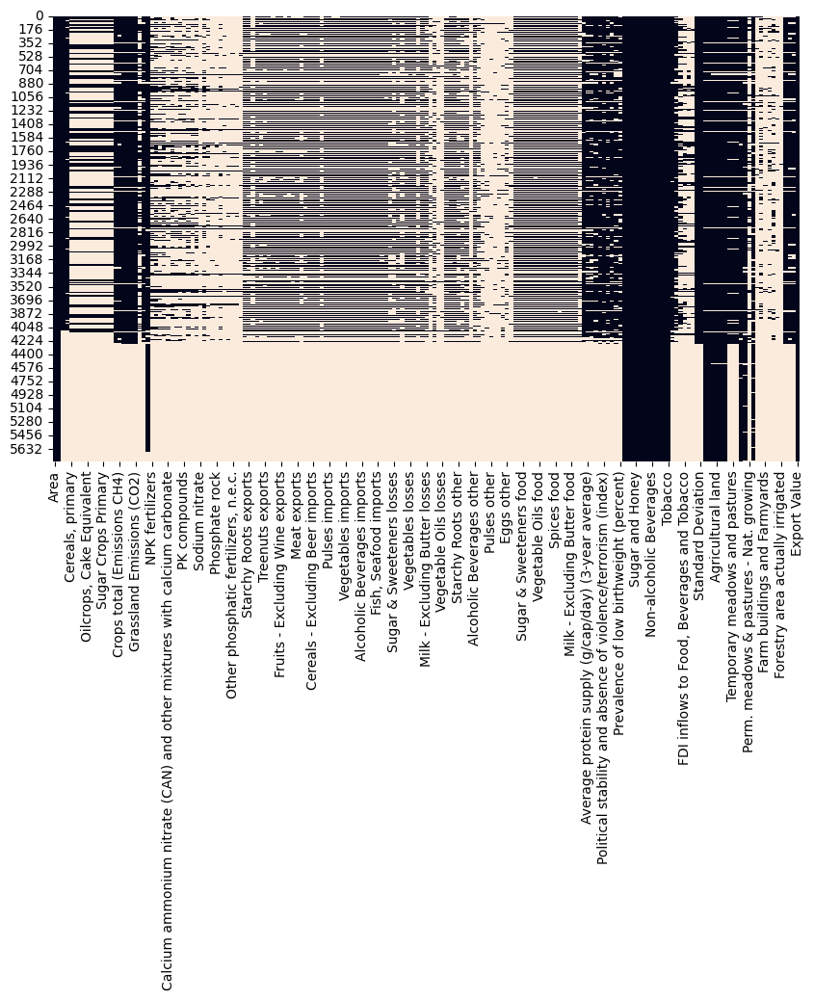

In [123]:
plt.figure(figsize=(10, 6))
sns.heatmap(data.isna(), cbar=False)

### Obtaining and visualizising the impact of each feature on the label.

#### Correlation Matrix (Pearson)

In [124]:
 data_correlation = data.drop(["Year", "Area"], axis=1)

In [125]:
correlation_matrix = data_correlation.corr()
correlation_matrix

,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,"Cereals, primary","Citrus Fruit, Total","Fibre Crops, Fibre Equivalent",Fruit Primary,"Oilcrops, Cake Equivalent","Oilcrops, Oil Equivalent","Pulses, Total","Roots and Tubers, Total",...,Agriculture area actually irrigated,Farm buildings and Farmyards,Cropland area actually irrigated,Perm. meadows & pastures - Cultivated,Perm. meadows & pastures area actually irrig.,Forestry area actually irrigated,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
"Consumer Prices, Food Indices (2015 = 100)",1.000000,0.350522,-0.025163,-0.016189,-0.010830,-0.017570,-0.014920,-0.026747,-0.025201,-0.037014,...,-0.028042,-0.033604,0.055754,-0.011424,-0.094606,0.731148,-0.003670,-0.007098,-0.006333,-0.007465
Food price inflation,0.350522,1.000000,-0.105098,-0.020317,-0.048940,-0.029748,-0.056267,-0.061816,-0.068688,-0.067681,...,0.016474,0.111715,0.011153,0.065460,0.006956,0.766229,-0.008727,-0.047445,-0.032728,-0.033600
"Cereals, primary",-0.025163,-0.105098,1.000000,0.441110,0.422076,0.436499,0.690477,0.258880,0.512874,0.540901,...,0.039024,-0.281258,0.414799,-0.054907,0.711753,0.833382,0.515848,0.370295,0.289634,0.551205
"Citrus Fruit, Total",-0.016189,-0.020317,0.441110,1.000000,0.041014,0.564475,0.532201,0.259667,0.159050,0.550680,...,-0.131407,0.140189,-0.001540,0.269300,0.220999,-0.855237,0.394524,0.264097,0.401347,0.379553
"Fibre Crops, Fibre Equivalent",-0.010830,-0.048940,0.422076,0.041014,1.000000,0.004902,0.325489,0.076042,0.337450,0.347860,...,-0.068756,-0.112893,0.359886,-0.013683,0.197382,0.003046,0.117861,0.077740,0.034640,0.292406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Forestry area actually irrigated,0.731148,0.766229,0.833382,-0.855237,0.003046,0.322728,0.281588,-0.323952,0.973086,0.968478,...,0.944365,0.999934,0.977332,0.326191,0.897420,1.000000,0.371378,-0.477781,-0.176741,-0.250837
Pesticides Agricultural Use,-0.003670,-0.008727,0.515848,0.394524,0.117861,0.312866,0.604019,0.094837,0.175056,0.359201,...,0.277398,0.701597,0.817629,0.649949,0.926160,0.371378,1.000000,0.068753,0.148978,0.707551
Pesticides Use per area of cropland,-0.007098,-0.047445,0.370295,0.264097,0.077740,0.526917,0.258907,0.593133,0.111486,0.113108,...,-0.139287,-0.144642,-0.055104,0.074440,0.057355,-0.477781,0.068753,1.000000,0.653444,0.081042
Pesticides Use per value of agricultural production,-0.006333,-0.032728,0.289634,0.401347,0.034640,0.529555,0.346499,0.559654,0.096487,0.164316,...,-0.163346,0.191880,-0.098026,0.075202,0.095647,-0.176741,0.148978,0.653444,1.000000,0.061902


#### Heatmap of the correlation matrix (Pearson)

This is a heatmap of the matrix correlation, filtering the most impactful features (< 0.5).

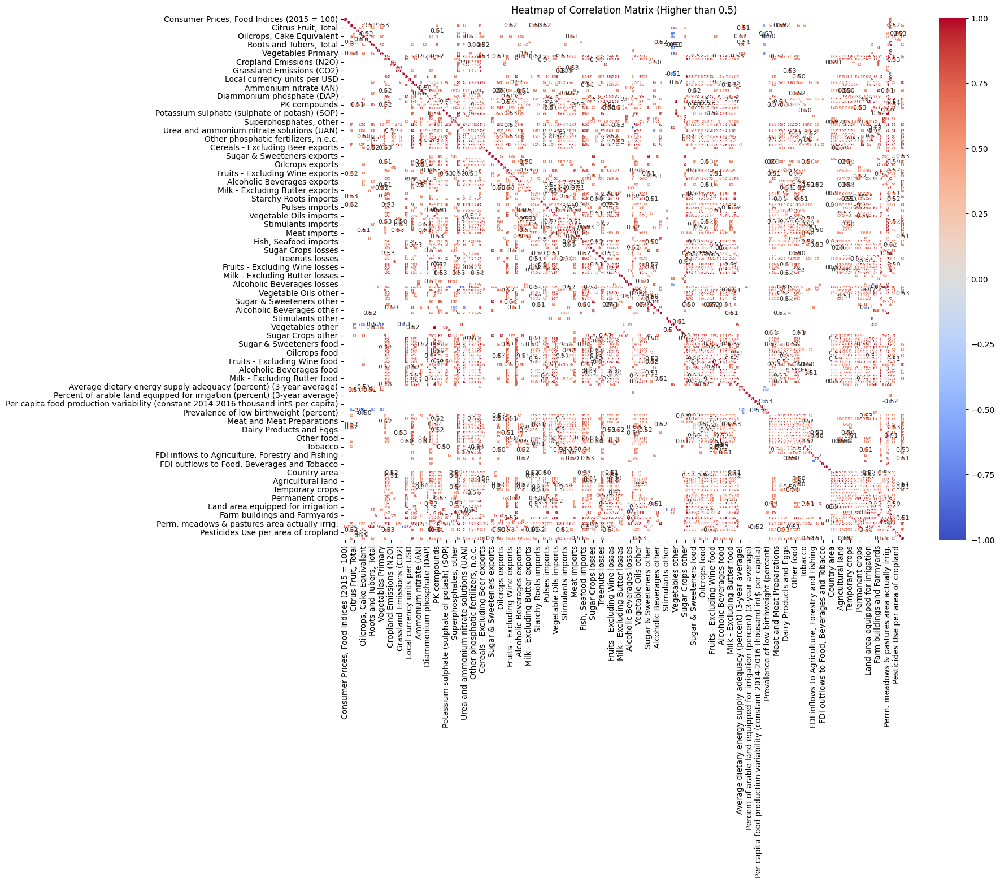

In [126]:
plt.figure(figsize=(16, 12))

sns.heatmap(correlation_matrix, annot=True, fmt=".2f",  cmap='coolwarm', center=0,
            annot_kws={"size": 8}, mask=abs(correlation_matrix) < 0.5)

plt.title('Heatmap of Correlation Matrix (Higher than 0.5)')
plt.show()

### Linear correlation of each feature on the label.

This Figure filters the impact of the features that has a linear correlation higher than 0.5 with the label.

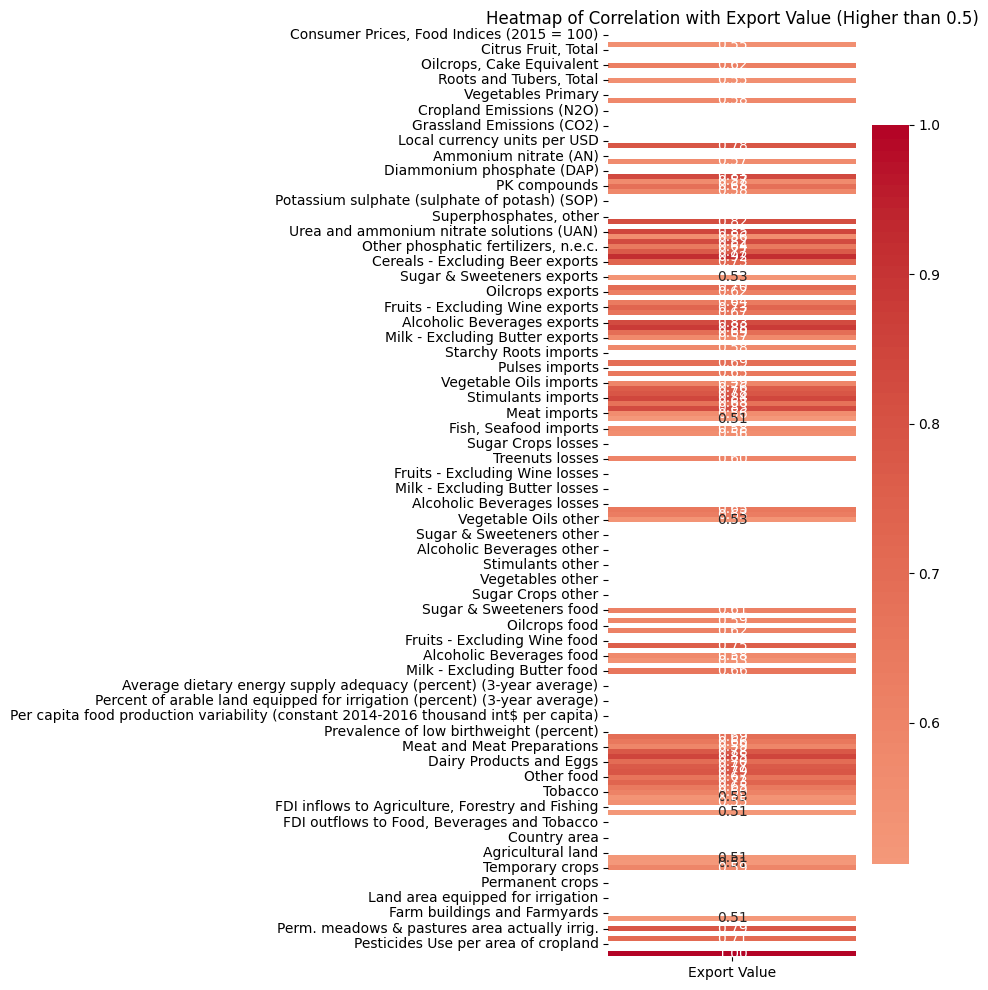

In [127]:
export_value_correlations = correlation_matrix[['Export Value']]

mask = abs(export_value_correlations) <= 0.5

plt.figure(figsize=(4, 12)) 
sns.heatmap(export_value_correlations, annot=True, fmt=".2f", cmap='coolwarm', center=0,
            annot_kws={"size": 10}, mask=mask, cbar_kws={"shrink": .8})
plt.title('Heatmap of Correlation with Export Value (Higher than 0.5)')
plt.show()


### Dropping features

It is important to analyse at the same time all the rows and columns whose NaN values are extremely high. This is due to the visual difference of NaN values that Figure 1 shows between the lower and upper part of the dataframe.  Before taking the decision of which features drop or preserve, it is importante to look at the distribution of the NaN values, because as shown in Figure 1, some features has almost all of their NaN values concentrated at the end of the data. Some features has a high percentage of Nan values but are only concentrated on the lower part of the dataframe, while other features has a high amount of Nan values due to a general lack of information.

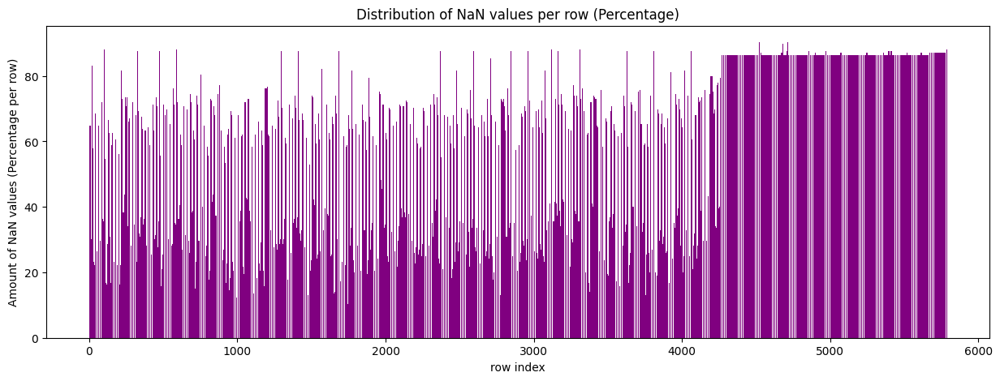

In [128]:
nan_per_row = data.isna().sum(axis=1)

plt.figure(figsize=(15, 5))
plt.bar(nan_count_rows_percent.index, nan_count_rows_percent.values, color='purple')
plt.title('Distribution of NaN values per row (Percentage)')
plt.xlabel('row index')
plt.ylabel('Amount of NaN values (Percentage per row)')
plt.show()

It's also essential to know the distribution of correlation of the features with the label

In [129]:
correlation_values = correlation_matrix["Export Value"].dropna()  

bins = np.arange(-1, 1.1, 0.1) 
labels = [f"{round(b,1)} to {round(b+0.1,1)}" for b in bins[:-1]] 

correlation_categories = pd.cut(correlation_values, bins=bins, labels=labels, include_lowest=True)
correlation_counts = correlation_categories.value_counts().sort_index()

print(correlation_counts)

Export Value
-1.0 to -0.9     0
-0.9 to -0.8     0
-0.8 to -0.7     0
-0.7 to -0.6     0
-0.6 to -0.5     0
-0.5 to -0.4     0
-0.4 to -0.3     1
-0.3 to -0.2     3
-0.2 to -0.1     3
-0.1 to -0.0     5
-0.0 to 0.1      6
0.1 to 0.2      14
0.2 to 0.3      26
0.3 to 0.4      33
0.4 to 0.5      17
0.5 to 0.6      28
0.6 to 0.7      21
0.7 to 0.8      14
0.8 to 0.9       9
0.9 to 1.0       1
Name: count, dtype: int64


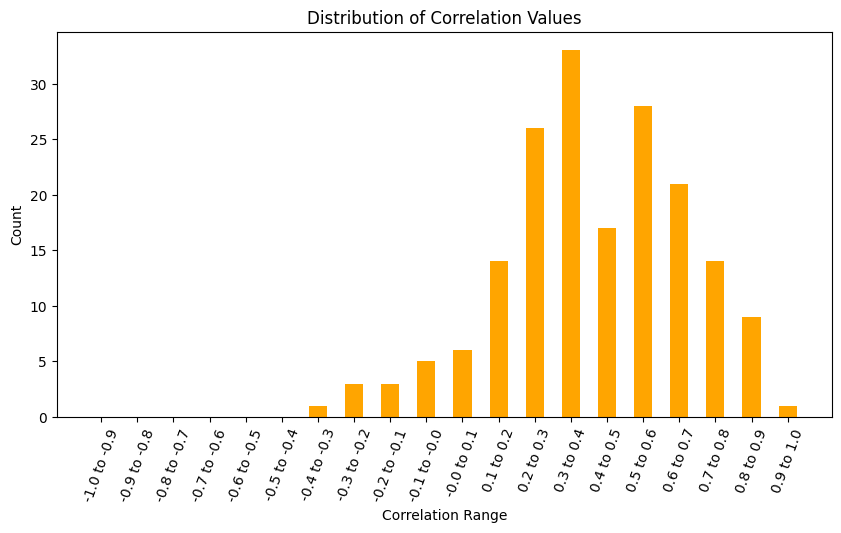

In [130]:
plt.figure(figsize=(10, 5))
plt.bar(correlation_counts.index, correlation_counts.values, width=0.5, color='orange') 
plt.xlabel('Correlation Range')
plt.ylabel('Count')
plt.title('Distribution of Correlation Values')
plt.xticks(rotation=70)
plt.show()

----

In order to reflect relably the percentage of NaN values of the data, the percentages will be taken into account without the rows where the vast majority of data is missed. Since the majority of features has around a 80% of NaN values after the row number 4250, only the rows before that one, will be considered.

In this way, it's possible to visualize a more reliable percentage of NaN values per feature throughout the entire dataframe. After this analysis, the analysis to determined which rows will be dropped will be crrried out.

In [131]:
nan_count_columns_filtered = data.drop(["Area", "Year"], axis=1).isna()[:4250].sum()
nan_count_columns_percent_filtered = (nan_count_columns_filtered/(data.shape[0]))*100
nan_count_columns_percent_filtered

Consumer Prices, Food Indices (2015 = 100)              2.833449
Food price inflation                                    5.805114
Cereals, primary                                       49.118867
Citrus Fruit, Total                                    49.118867
Fibre Crops, Fibre Equivalent                          49.118867
                                                         ...    
Forestry area actually irrigated                       72.719419
Pesticides Agricultural Use                             5.079475
Pesticides Use per area of cropland                     8.724948
Pesticides Use per value of agricultural production     9.830684
Export Value                                            0.000000
Length: 183, dtype: float64

---

#### Analysis of features with more than 90% of NaN values.

No features in this range.

In [132]:
# Percentages of NaN values per feature
higher_ninety = nan_count_columns_percent_filtered[nan_count_columns_percent_filtered > 90]

In [133]:
higher_ninety

Series([], dtype: float64)

#### Analysis of columns with more than 80% less than 90% of NaN values.

No features in this range.

In [134]:
# Percentages of NaN values per feature
higher_eighty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 80) & (nan_count_columns_percent_filtered < 90)]
higher_eighty

Series([], dtype: float64)

#### Analysis of columns with more than 70% less than 80% of NaN values.

Percentage of NaN values per feature:

In [135]:
higher_seventy = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 70) & (nan_count_columns_percent_filtered < 80)]
higher_seventy

Sodium nitrate                                   70.473393
Other NK compounds                               70.196959
Vegetable Oils losses                            70.421562
Treenuts other                                   70.093296
Land area actually irrigated                     70.732550
Farm buildings and Farmyards                     70.404285
Perm. meadows & pastures area actually irrig.    70.697996
Forestry area actually irrigated                 72.719419
dtype: float64

In [136]:
# Correlation with the label
for i in range(len(higher_seventy)):
    print(higher_seventy.index[i]+":", "Percentage NaN values:", round(higher_seventy[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_seventy.index[i]],"\n")

Sodium nitrate: Percentage NaN values: 70.47 %  | Linear correlation: 0.14006452307971629 

Other NK compounds: Percentage NaN values: 70.2 %  | Linear correlation: 0.9207668297472085 

Vegetable Oils losses: Percentage NaN values: 70.42 %  | Linear correlation: 0.6537498384713502 

Treenuts other: Percentage NaN values: 70.09 %  | Linear correlation: -0.11274450114894669 

Land area actually irrigated: Percentage NaN values: 70.73 %  | Linear correlation: -0.08930429976328336 

Farm buildings and Farmyards: Percentage NaN values: 70.4 %  | Linear correlation: 0.3792956689637972 

Perm. meadows & pastures area actually irrig.: Percentage NaN values: 70.7 %  | Linear correlation: 0.7888486029692634 

Forestry area actually irrigated: Percentage NaN values: 72.72 %  | Linear correlation: -0.25083731665193365 



<Axes: >

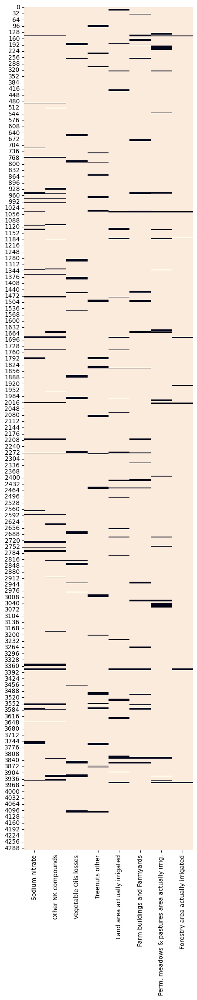

In [137]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4300][higher_seventy.index], cbar=False)

Due to the lack of information of these features throughout all the data frame, they will be dropped.

In [138]:
data = data.drop(higher_seventy.index, axis=1)

#### Analysis of columns with more than 60% less than 70% of NaN values.

Percentage of NaN values per feature:

In [139]:
higher_sixty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 60) & (nan_count_columns_percent_filtered < 70)]
higher_sixty



PK compounds                                         60.245335
Superphosphates, other                               63.441603
Ammonia, anhydrous                                   68.728404
Phosphate rock                                       69.350380
Urea and ammonium nitrate solutions (UAN)            63.787146
Fertilizers n.e.c.                                   69.125777
Other nitrogenous fertilizers, n.e.c.                68.676572
Other phosphatic fertilizers, n.e.c.                 69.108500
Other potassic fertilizers, n.e.c.                   68.987560
Meat losses                                          62.923290
Alcoholic Beverages losses                           69.143055
Spices other                                         69.574983
Meat other                                           65.791292
Stimulants other                                     68.953006
Pulses other                                         69.868694
Vegetables other                                     69

In [140]:
for i in range(len(higher_sixty)):
    print(higher_sixty.index[i]+":", "Percentage NaN values:", round(higher_sixty[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_sixty.index[i]],"\n")

PK compounds: Percentage NaN values: 60.25 %  | Linear correlation: 0.6823257357872096 

Superphosphates, other: Percentage NaN values: 63.44 %  | Linear correlation: 0.23910868276268565 

Ammonia, anhydrous: Percentage NaN values: 68.73 %  | Linear correlation: 0.8174919263944811 

Phosphate rock: Percentage NaN values: 69.35 %  | Linear correlation: 0.10582122500611753 

Urea and ammonium nitrate solutions (UAN): Percentage NaN values: 63.79 %  | Linear correlation: 0.8485237086646766 

Fertilizers n.e.c.: Percentage NaN values: 69.13 %  | Linear correlation: 0.5622989399439253 

Other nitrogenous fertilizers, n.e.c.: Percentage NaN values: 68.68 %  | Linear correlation: 0.8219216634771682 

Other phosphatic fertilizers, n.e.c.: Percentage NaN values: 69.11 %  | Linear correlation: 0.6412218755695687 

Other potassic fertilizers, n.e.c.: Percentage NaN values: 68.99 %  | Linear correlation: 0.7718896533890844 

Meat losses: Percentage NaN values: 62.92 %  | Linear correlation: 0.1116

<Axes: >

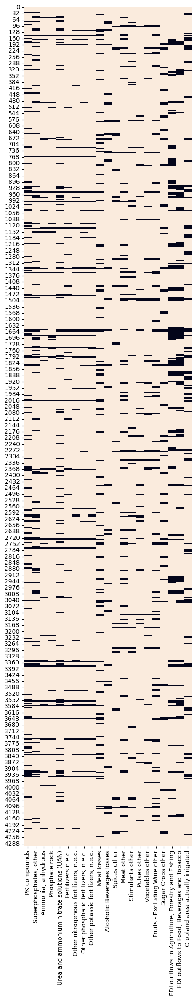

In [141]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4300][higher_sixty.index], cbar=False)

In this case, "PK compounds" has 0.68 of linear correlation, however, every feature will be dropped due to the lack of information. The correlation does not justify the risk to introduce so much bias to the data.

In [142]:
data = data.drop(higher_sixty.index, axis=1)

#### Analysis of columns with more than 50% and less than 60% of NaN values.

In [143]:
higher_fifty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 50) & (nan_count_columns_percent_filtered < 60)]
higher_fifty

Ammonium nitrate (AN)                                                       54.474775
Ammonium sulphate                                                           51.382170
Calcium ammonium nitrate (CAN) and other mixtures with calcium carbonate    58.690394
Diammonium phosphate (DAP)                                                  53.299931
Monoammonium phosphate (MAP)                                                58.172080
Other NP compounds                                                          56.254319
Potassium chloride (muriate of potash) (MOP)                                51.641327
Potassium nitrate                                                           59.208708
Potassium sulphate (sulphate of potash) (SOP)                               55.476849
Superphosphates above 35%                                                   56.997236
Sugar Crops exports                                                         53.921907
Spices losses                                         

In [144]:
# Correlation with the label
for i in range(len(higher_fifty)):
    print(higher_fifty.index[i]+":", "Percentage NaN values:", round(higher_fifty[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_fifty.index[i]],"\n")

Ammonium nitrate (AN): Percentage NaN values: 54.47 %  | Linear correlation: 0.40172429098140533 

Ammonium sulphate: Percentage NaN values: 51.38 %  | Linear correlation: 0.5705785117788111 

Calcium ammonium nitrate (CAN) and other mixtures with calcium carbonate: Percentage NaN values: 58.69 %  | Linear correlation: 0.40763031519708304 

Diammonium phosphate (DAP): Percentage NaN values: 53.3 %  | Linear correlation: 0.3024156535596426 

Monoammonium phosphate (MAP): Percentage NaN values: 58.17 %  | Linear correlation: 0.8339198745574171 

Other NP compounds: Percentage NaN values: 56.25 %  | Linear correlation: 0.5686343543429737 

Potassium chloride (muriate of potash) (MOP): Percentage NaN values: 51.64 %  | Linear correlation: 0.5829408295482091 

Potassium nitrate: Percentage NaN values: 59.21 %  | Linear correlation: 0.3504784900855498 

Potassium sulphate (sulphate of potash) (SOP): Percentage NaN values: 55.48 %  | Linear correlation: 0.28111753061500266 

Superphosphates a

<Axes: >

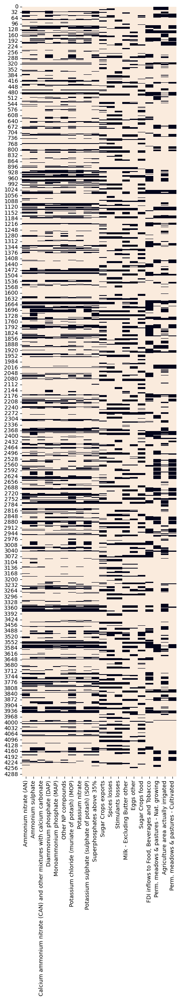

In [145]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4300][higher_fifty.index], cbar=False)

In this case, all the features will be dropped as they do not have enought impact in the label to justify the imputation of any of them. The highest linear correlation with the label, in this case, is 0.83. Even if it is very high, it has 58.1% of NaN values, which would potentially introduce a high amount of bias to the data.

In [146]:
data = data.drop(higher_fifty.index, axis=1)

#### Analysis of columns with more than 40% and less than 50% of NaN values.

In [147]:
higher_fourty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 40) & (nan_count_columns_percent_filtered < 50)]
higher_fourty

Cereals, primary                                                                              49.118867
Citrus Fruit, Total                                                                           49.118867
Fibre Crops, Fibre Equivalent                                                                 49.118867
Fruit Primary                                                                                 49.118867
Oilcrops, Cake Equivalent                                                                     49.118867
Oilcrops, Oil Equivalent                                                                      49.118867
Pulses, Total                                                                                 49.118867
Roots and Tubers, Total                                                                       49.118867
Sugar Crops Primary                                                                           49.118867
Treenuts, Total                                                 

In [148]:
# Correlation with the label
for i in range(len(higher_fourty)):
    print(higher_fourty.index[i]+":", "Percentage NaN values:", round(higher_fourty[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_fourty.index[i]],"\n")

Cereals, primary: Percentage NaN values: 49.12 %  | Linear correlation: 0.5512046433266596 

Citrus Fruit, Total: Percentage NaN values: 49.12 %  | Linear correlation: 0.3795527345737762 

Fibre Crops, Fibre Equivalent: Percentage NaN values: 49.12 %  | Linear correlation: 0.29240632961942314 

Fruit Primary: Percentage NaN values: 49.12 %  | Linear correlation: 0.28166784051521654 

Oilcrops, Cake Equivalent: Percentage NaN values: 49.12 %  | Linear correlation: 0.6246535491928702 

Oilcrops, Oil Equivalent: Percentage NaN values: 49.12 %  | Linear correlation: 0.10556263062291994 

Pulses, Total: Percentage NaN values: 49.12 %  | Linear correlation: 0.25665562262773783 

Roots and Tubers, Total: Percentage NaN values: 49.12 %  | Linear correlation: 0.551992224069881 

Sugar Crops Primary: Percentage NaN values: 49.12 %  | Linear correlation: 0.16226823061236081 

Treenuts, Total: Percentage NaN values: 49.12 %  | Linear correlation: 0.12239635689259452 

Vegetables Primary: Percentag

<Axes: >

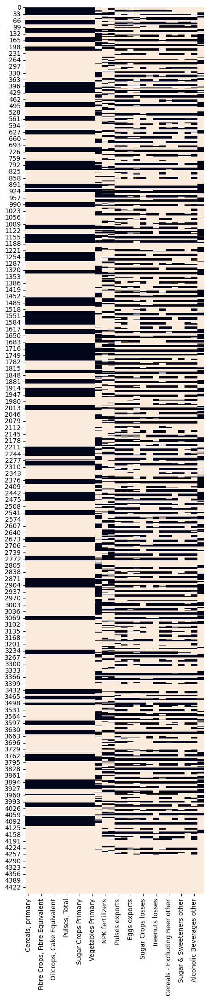

In [149]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4455][higher_fourty.index], cbar=False)

In this case, it is decided to drop all the features. The most impactful feature for the label is of 0.78, but due to the 48.5% of NaN values, it will be dropped.

In [150]:
data = data.drop(higher_fourty.index, axis=1)

#### Analysis of columns with more than 30% and less than 40% of NaN values.

Percentage of NaN values per feature:

In [151]:
higher_thirty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 30) & (nan_count_columns_percent_filtered < 40)]
higher_thirty

Cereals - Excluding Beer exports    37.802350
Starchy Roots exports               39.754665
Sugar & Sweeteners exports          38.234278
Oilcrops exports                    38.130615
Vegetable Oils exports              38.044229
Vegetables exports                  37.715964
Fruits - Excluding Wine exports     37.923290
Stimulants exports                  38.044229
Spices exports                      38.562543
Alcoholic Beverages exports         38.510712
Meat exports                        39.512785
Milk - Excluding Butter exports     39.841050
Fish, Seafood exports               37.249482
Cereals - Excluding Beer imports    37.249482
Starchy Roots imports               37.249482
Sugar & Sweeteners imports          37.249482
Pulses imports                      37.284036
Treenuts imports                    37.422253
Oilcrops imports                    37.370422
Vegetable Oils imports              37.249482
Vegetables imports                  37.249482
Fruits - Excluding Wine imports   

In [152]:
# Correlation with the label
for i in range(len(higher_thirty)):
    print(higher_thirty.index[i]+":", "Percentage NaN values:", round(higher_thirty[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_thirty.index[i]],"\n")

Cereals - Excluding Beer exports: Percentage NaN values: 37.8 %  | Linear correlation: 0.7259376127974158 

Starchy Roots exports: Percentage NaN values: 39.75 %  | Linear correlation: 0.3640587399235919 

Sugar & Sweeteners exports: Percentage NaN values: 38.23 %  | Linear correlation: 0.5286193712064862 

Oilcrops exports: Percentage NaN values: 38.13 %  | Linear correlation: 0.6233843991998284 

Vegetable Oils exports: Percentage NaN values: 38.04 %  | Linear correlation: 0.33090072918014346 

Vegetables exports: Percentage NaN values: 37.72 %  | Linear correlation: 0.6381197160971347 

Fruits - Excluding Wine exports: Percentage NaN values: 37.92 %  | Linear correlation: 0.7274594637644992 

Stimulants exports: Percentage NaN values: 38.04 %  | Linear correlation: 0.671279577989423 

Spices exports: Percentage NaN values: 38.56 %  | Linear correlation: 0.35761612270373 

Alcoholic Beverages exports: Percentage NaN values: 38.51 %  | Linear correlation: 0.8273082224063965 

Meat exp

<Axes: >

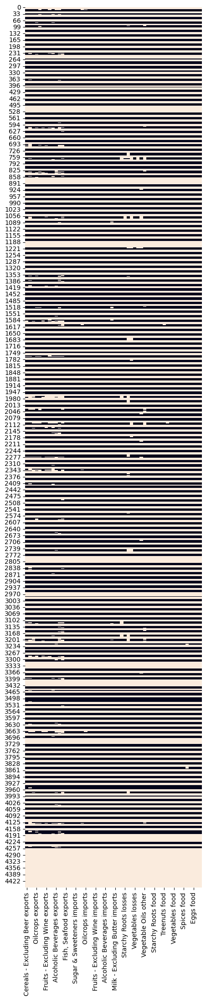

In [153]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4455][higher_thirty.index], cbar=False)

In [154]:
higher_thirty_drop = []
for i in range(len(correlation_matrix["Export Value"][higher_thirty.index].values)):
    a = correlation_matrix["Export Value"][higher_thirty.index].values[i]
    index_d = correlation_matrix["Export Value"][higher_thirty.index].index[i]
    if a < 0.69:
        higher_thirty_drop.append(index_d)

In [155]:
higher_thirty_drop

['Starchy Roots exports',
 'Sugar & Sweeteners exports',
 'Oilcrops exports',
 'Vegetable Oils exports',
 'Vegetables exports',
 'Stimulants exports',
 'Spices exports',
 'Milk - Excluding Butter exports',
 'Fish, Seafood exports',
 'Cereals - Excluding Beer imports',
 'Starchy Roots imports',
 'Pulses imports',
 'Treenuts imports',
 'Oilcrops imports',
 'Vegetable Oils imports',
 'Spices imports',
 'Meat imports',
 'Eggs imports',
 'Milk - Excluding Butter imports',
 'Fish, Seafood imports',
 'Cereals - Excluding Beer losses',
 'Starchy Roots losses',
 'Pulses losses',
 'Oilcrops losses',
 'Vegetables losses',
 'Fruits - Excluding Wine losses',
 'Eggs losses',
 'Vegetable Oils other',
 'Fish, Seafood other',
 'Cereals - Excluding Beer food',
 'Starchy Roots food',
 'Sugar & Sweeteners food',
 'Pulses food',
 'Treenuts food',
 'Oilcrops food',
 'Vegetable Oils food',
 'Vegetables food',
 'Fruits - Excluding Wine food',
 'Spices food',
 'Alcoholic Beverages food',
 'Meat food',
 'Eggs f

In [156]:
data = data.drop(higher_thirty.index, axis=1)

#### Analysis of columns with more than 20% and less than 30% of NaN values.

No features in this range.

In [157]:
higher_twenty = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 20) & (nan_count_columns_percent_filtered < 30)]
higher_twenty

Series([], dtype: float64)

#### Analysis of columns with more than 10% and less than 20% of NaN values.

In [158]:
higher_ten = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 10) & (nan_count_columns_percent_filtered < 20)]
higher_ten

Average protein supply (g/cap/day) (3-year average)                                     11.679337
Cereal import dependency ratio (percent) (3-year average)                               14.530062
Per capita food production variability (constant 2014-2016 thousand int$ per capita)    10.608155
Per capita food supply variability (kcal/cap/day)                                       10.176227
Prevalence of anemia among women of reproductive age (15-49 years)                      12.629578
Prevalence of low birthweight (percent)                                                 19.695923
Total FDI outflows                                                                      15.100207
dtype: float64

In [159]:
for i in range(len(higher_ten)):
    print(higher_ten.index[i]+":", "Percentage NaN values:", round(higher_ten[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_ten.index[i]],"\n")

Average protein supply (g/cap/day) (3-year average): Percentage NaN values: 11.68 %  | Linear correlation: 0.35310824671460334 

Cereal import dependency ratio (percent) (3-year average): Percentage NaN values: 14.53 %  | Linear correlation: -0.23418342712384024 

Per capita food production variability (constant 2014-2016 thousand int$ per capita): Percentage NaN values: 10.61 %  | Linear correlation: 0.14025654055820666 

Per capita food supply variability (kcal/cap/day): Percentage NaN values: 10.18 %  | Linear correlation: -0.14036385300663923 

Prevalence of anemia among women of reproductive age (15-49 years): Percentage NaN values: 12.63 %  | Linear correlation: -0.3324397548133944 

Prevalence of low birthweight (percent): Percentage NaN values: 19.7 %  | Linear correlation: -0.2285826168989622 

Total FDI outflows: Percentage NaN values: 15.1 %  | Linear correlation: 0.5532452229620922 



<Axes: >

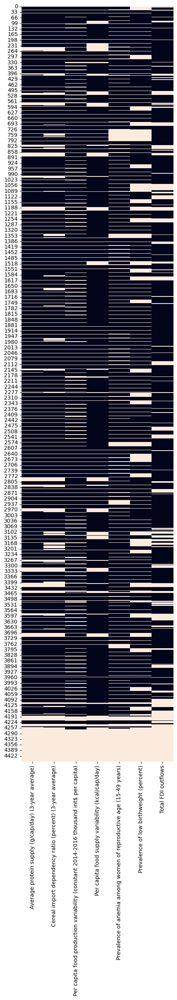

In [160]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4455][higher_ten.index], cbar=False)

All the features will be preserved and imputed. The lack of information is not so high and can be handle.

#### Analysis of columns with more than 0%  and less than 10% of NaN values.

In [161]:
higher_zero = nan_count_columns_percent_filtered[(nan_count_columns_percent_filtered > 0) & (nan_count_columns_percent_filtered < 10)]
higher_zero

Consumer Prices, Food Indices (2015 = 100)                                       2.833449
Food price inflation                                                             5.805114
Crops total (Emissions N2O)                                                      5.286800
Crops total (Emissions CH4)                                                      6.427091
Cropland Emissions (N2O)                                                         3.178991
Cropland Emissions (CO2)                                                         3.178991
Grassland Emissions (N2O)                                                        3.178991
Grassland Emissions (CO2)                                                        3.178991
Employment in agriculture, forestry and fishing - ILO modelled estimates         6.340705
Local currency units per USD                                                     2.591569
Average dietary energy supply adequacy (percent) (3-year average)                6.461645
Percent of

In [162]:
for i in range(len(higher_zero)):
    print(higher_zero.index[i]+":", "Percentage NaN values:", round(higher_zero[i], 2),"%  | Linear correlation:", correlation_matrix["Export Value"][higher_zero.index[i]],"\n")

Consumer Prices, Food Indices (2015 = 100): Percentage NaN values: 2.83 %  | Linear correlation: -0.007464623469511675 

Food price inflation: Percentage NaN values: 5.81 %  | Linear correlation: -0.03359967816200691 

Crops total (Emissions N2O): Percentage NaN values: 5.29 %  | Linear correlation: 0.5848264811765053 

Crops total (Emissions CH4): Percentage NaN values: 6.43 %  | Linear correlation: 0.28750922264978246 

Cropland Emissions (N2O): Percentage NaN values: 3.18 %  | Linear correlation: 0.34534620363938373 

Cropland Emissions (CO2): Percentage NaN values: 3.18 %  | Linear correlation: 0.2423940704917093 

Grassland Emissions (N2O): Percentage NaN values: 3.18 %  | Linear correlation: 0.3442859491561702 

Grassland Emissions (CO2): Percentage NaN values: 3.18 %  | Linear correlation: 0.41793507502240773 

Employment in agriculture, forestry and fishing - ILO modelled estimates: Percentage NaN values: 6.34 %  | Linear correlation: 0.21537092120772308 

Local currency units 

<Axes: >

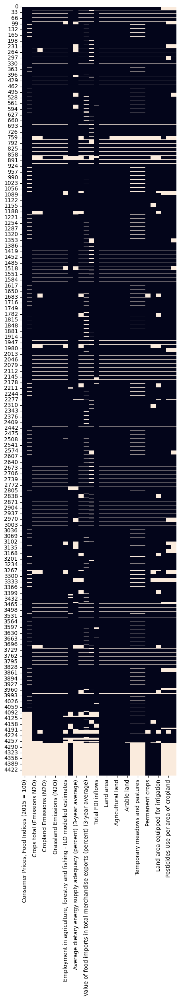

In [163]:
plt.figure(figsize=(5, 25))
sns.heatmap(data.isna()[:4455][higher_zero.index], cbar=False)

In this case, all the features will be preserved as they have a large amount of available data and few percentage of NaN values throughout the dataframe. Even if the correlation does not indicate a high impact on the label, this will be handle with the method Principal Component Analysis (PCA) to let the most important features on the data for training the model, making a dimensionality reduction.

---

In [164]:
data

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,Crops total (Emissions N2O),Crops total (Emissions CH4),Cropland Emissions (N2O),Cropland Emissions (CO2),Grassland Emissions (N2O),Grassland Emissions (CO2),...,Temporary crops,Temporary meadows and pastures,Temporary fallow,Permanent crops,Permanent meadows and pastures,Land area equipped for irrigation,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
0,Afghanistan,2000,319.558176,NaN,0.7056,20.8471,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,111.0,30000.0,3203.0,NaN,NaN,NaN,43095.0
1,Afghanistan,2001,358.722573,153.368307,0.7054,19.2605,0.0,0.0,0.0,0.0,...,2502.0,0.0,5181.0,112.0,30000.0,3203.0,NaN,NaN,NaN,35440.0
2,Afghanistan,2002,424.138702,219.054193,1.0656,21.2553,0.0,0.0,0.0,0.0,...,2111.0,0.0,5567.0,112.0,30000.0,3208.0,NaN,NaN,NaN,35964.0
3,Afghanistan,2003,482.437360,169.226933,1.3117,23.7017,0.0,0.0,0.0,0.0,...,3761.0,0.0,4011.0,112.0,30000.0,3208.0,NaN,NaN,NaN,58782.0
4,Afghanistan,2004,550.086733,168.866060,1.0856,30.3089,0.0,0.0,0.0,0.0,...,2934.0,0.0,4882.0,112.0,30000.0,3208.0,NaN,NaN,NaN,64919.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5783,Cook Islands,1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,575.0
5784,Cook Islands,1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,660.0
5785,Cook Islands,1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,510.0
5786,Cook Islands,1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,264.0


In [165]:
data.columns.nunique()

54

### Dropping rows

As seen below and as mentioned before, there is an exagerated concentration in the lower part of the data. 

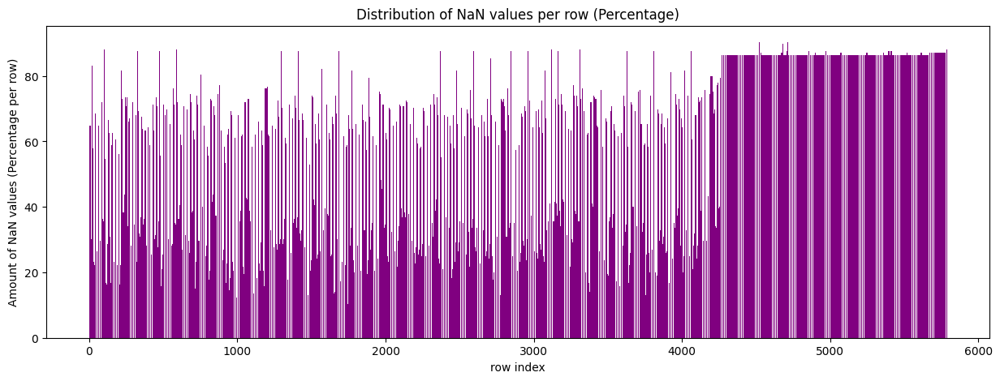

In [166]:
nan_per_row = data.isna().sum(axis=1)

plt.figure(figsize=(15, 5))
plt.bar(nan_count_rows_percent.index, nan_count_rows_percent.values, color='purple')
plt.title('Distribution of NaN values per row (Percentage)')
plt.xlabel('row index')
plt.ylabel('Amount of NaN values (Percentage per row)')
plt.show()

<Axes: >

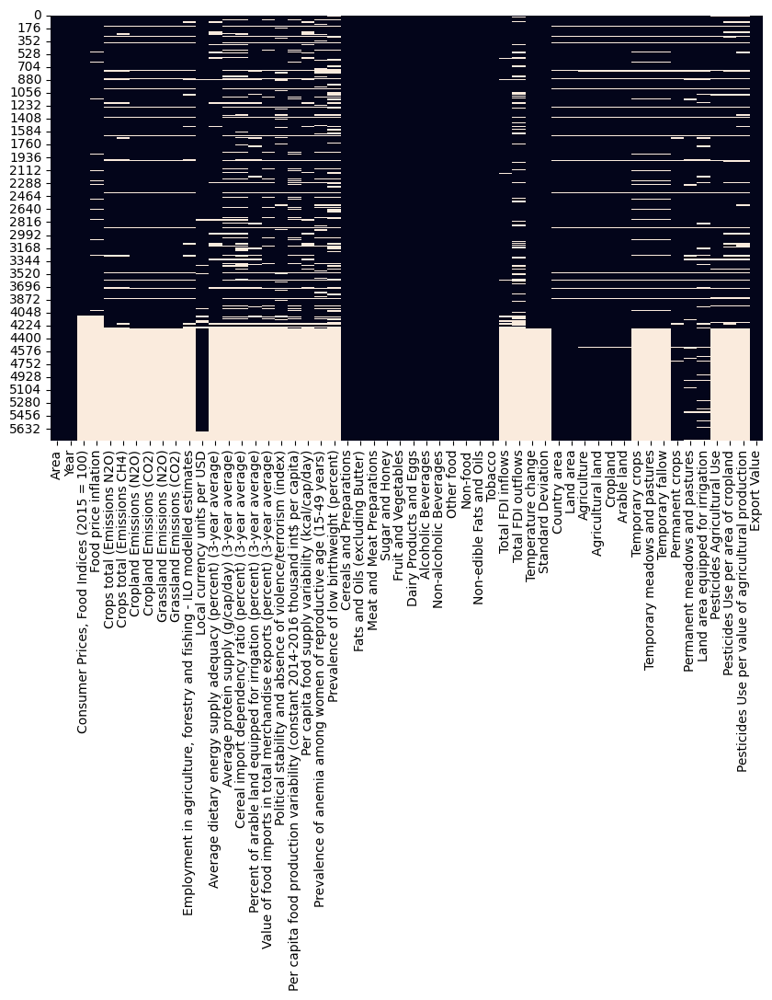

In [167]:
plt.figure(figsize=(10, 6))
sns.heatmap(data.isna(), cbar=False)

In [168]:
data = data.drop(data.index[4250:], axis=0)

In [169]:
data.head(-50)

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,Crops total (Emissions N2O),Crops total (Emissions CH4),Cropland Emissions (N2O),Cropland Emissions (CO2),Grassland Emissions (N2O),Grassland Emissions (CO2),...,Temporary crops,Temporary meadows and pastures,Temporary fallow,Permanent crops,Permanent meadows and pastures,Land area equipped for irrigation,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
0,Afghanistan,2000,319.558176,NaN,0.7056,20.8471,0.0000,0.0000,0.0000,0.0,...,NaN,NaN,NaN,111.0,30000.000,3203.0,NaN,NaN,NaN,43095.0
1,Afghanistan,2001,358.722573,153.368307,0.7054,19.2605,0.0000,0.0000,0.0000,0.0,...,2502.0000,0.0000,5181.0000,112.0,30000.000,3203.0,NaN,NaN,NaN,35440.0
2,Afghanistan,2002,424.138702,219.054193,1.0656,21.2553,0.0000,0.0000,0.0000,0.0,...,2111.0000,0.0000,5567.0000,112.0,30000.000,3208.0,NaN,NaN,NaN,35964.0
3,Afghanistan,2003,482.437360,169.226933,1.3117,23.7017,0.0000,0.0000,0.0000,0.0,...,3761.0000,0.0000,4011.0000,112.0,30000.000,3208.0,NaN,NaN,NaN,58782.0
4,Afghanistan,2004,550.086733,168.866060,1.0856,30.3089,0.0000,0.0000,0.0000,0.0,...,2934.0000,0.0000,4882.0000,112.0,30000.000,3208.0,NaN,NaN,NaN,64919.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,Faroe Islands,2004,NaN,NaN,0.0001,NaN,0.0067,9.5155,0.1617,226.4,...,0.0460,0.0087,0.0093,NaN,96.475,NaN,18.63,NaN,5.85,22710.0
4196,Faroe Islands,2005,NaN,NaN,0.0001,NaN,0.0067,9.5155,0.1617,226.4,...,0.0462,0.0086,0.0092,NaN,96.475,NaN,18.47,NaN,5.86,24618.0
4197,Faroe Islands,2006,NaN,NaN,0.0001,NaN,0.0067,9.5155,0.1617,226.4,...,0.0465,0.0083,0.0092,NaN,96.475,NaN,18.32,NaN,5.89,41573.0
4198,Faroe Islands,2007,NaN,NaN,0.0001,NaN,0.0067,9.5155,0.1617,226.4,...,0.0466,0.0083,0.0091,NaN,96.475,NaN,18.26,NaN,5.78,47938.0


<Axes: >

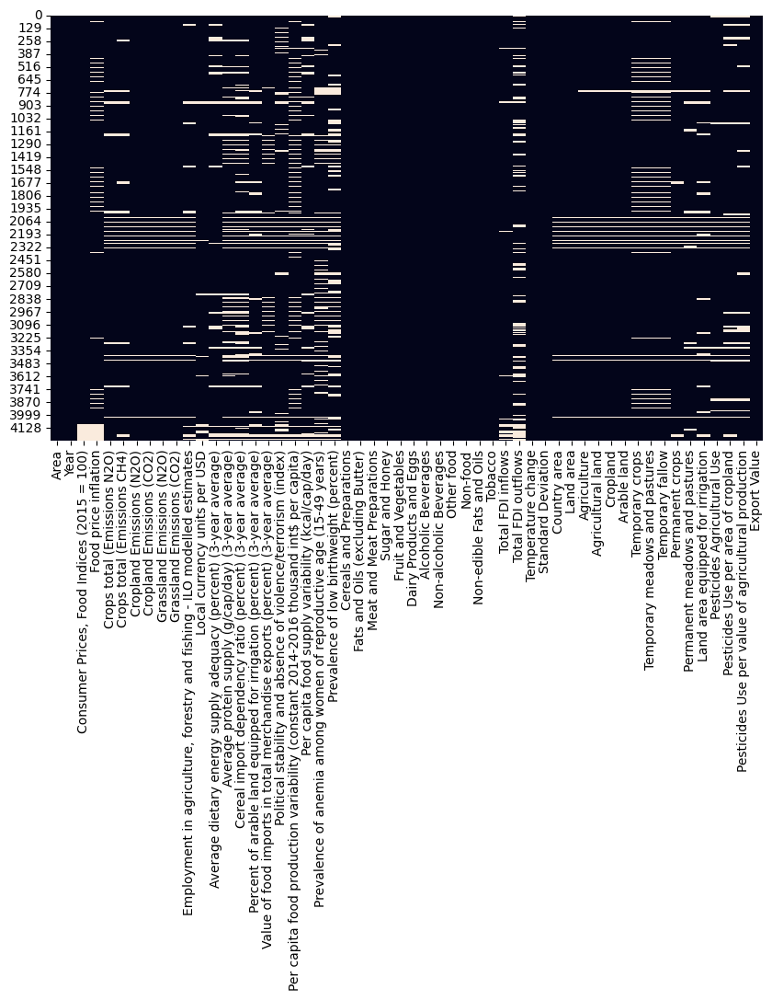

In [170]:
plt.figure(figsize=(10, 6))
sns.heatmap(data.isna(), cbar=False)

Even with this, there are still some rows with a high percentage of NaN values. Therefore, there will be analysized to decide whether it is possible to impute them or oppositely, drop them.

In [171]:
# As "data" has been updated, the vector with the percentages of the NaN data in each row is also updated.
nan_count_rows = data.drop(["Year","Area"], axis=1).isna().sum(axis=1)
nan_count_rows_percent = (nan_count_rows/(data.drop(["Year","Area"], axis=1).shape[1]))*100
nan_count_rows_percent

0       19.230769
1       11.538462
2        9.615385
3        7.692308
4        7.692308
          ...    
4245    30.769231
4246    30.769231
4247     7.692308
4248     7.692308
4249     7.692308
Length: 4250, dtype: float64

In [172]:
nan_count_rows_percent_sorted = nan_count_rows_percent.sort_values(ascending=False)
nan_count_rows_percent_sorted

4108    69.230769
20      65.384615
4039    63.461538
406     63.461538
2279    63.461538
          ...    
2406     0.000000
2407     0.000000
2408     0.000000
2409     0.000000
2125     0.000000
Length: 4250, dtype: float64

### Analyzing the rows with a high value of NaN values

#### Between 80% and 90%

In [173]:
((nan_count_rows_percent_sorted > 80) & (nan_count_rows_percent_sorted < 90)).sum()

0

In [174]:
print(((((nan_count_rows_percent_sorted > 80) & (nan_count_rows_percent_sorted < 90)).sum())*100)/4550, "%")

0.0 %


#### Between 70% and 80%

In [175]:
((nan_count_rows_percent_sorted > 70) & (nan_count_rows_percent_sorted < 80)).sum()

0

In [176]:
print(((((nan_count_rows_percent_sorted > 70) & (nan_count_rows_percent_sorted < 80)).sum())*100)/4550, "%")

0.0 %


#### Between 60% and 70%

In [177]:
((nan_count_rows_percent_sorted > 60) & (nan_count_rows_percent_sorted < 70)).sum()

40

In [178]:
print(((((nan_count_rows_percent_sorted > 60) & (nan_count_rows_percent_sorted < 70)).sum())*100)/4550, "%")

0.8791208791208791 %


#### Between 50% and 60%

In [179]:
((nan_count_rows_percent_sorted > 50) & (nan_count_rows_percent_sorted < 60)).sum()

144

In [180]:
print(((((nan_count_rows_percent_sorted > 50) & (nan_count_rows_percent_sorted < 60)).sum())*100)/4550, "%")

3.1648351648351647 %


#### Between 40% and 50%

In [181]:
((nan_count_rows_percent_sorted > 40) & (nan_count_rows_percent_sorted < 50)).sum()

3

In [182]:
print(((((nan_count_rows_percent_sorted >  40) & (nan_count_rows_percent_sorted < 50)).sum())*100)/4550, "%")

0.06593406593406594 %


#### Between 30% and 40%

In [183]:
((nan_count_rows_percent_sorted > 30) & (nan_count_rows_percent_sorted < 40)).sum()

60

In [184]:
print(((((nan_count_rows_percent_sorted > 30) & (nan_count_rows_percent_sorted < 40)).sum())*100)/4550, "%")

1.3186813186813187 %


It is considered that rows with less than 30% of NaN values can be habdle with no so much risk in producing a high bias in the model.

---

As shown above, there's a classification of different ranges of NaN values per row. Based on the percentage that the amount of rows correspond to the entire dataset, and the percentage of NaN values per each row. It is opted to drop the following rows:

Between 70% and 80% NaN value. Percentage representation in the entire dataset: 0.04395604395604396 %

Between 60% and 70% NaN value. Percentage representation in the entire dataset: 4.0 %  

Between 50% and 60% NaN value. Percentage representation in the entire dataset: 0.02197802197802198 %

Between 40% and 50% NaN value. Percentage representation in the entire dataset: 1.1868131868131868 %


In total, around 4% will be dropped of the dataset, which does not represent a big part of the data. The other rows will be imputed.

In [185]:
nan_count_rows = data.isna().sum(axis=1)
nan_count_rows_percent = (nan_count_rows/(data.shape[1]))*100
nan_count_rows_percent_sorted = nan_count_rows_percent.sort_values(ascending=False)
filtered_row_eighty = ((nan_count_rows_percent_sorted > 70) & (nan_count_rows_percent_sorted < 80))
data = data[~filtered_row_eighty] 

C:\Users\luisl\AppData\Local\Temp\ipykernel_15636\3349532469.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = data[~filtered_row_eighty]


In [186]:
nan_count_rows = data.isna().sum(axis=1)
nan_count_rows_percent = (nan_count_rows/(data.shape[1]))*100
nan_count_rows_percent_sorted = nan_count_rows_percent.sort_values(ascending=False)
filtered_row_sixty = ((nan_count_rows_percent_sorted > 60) & (nan_count_rows_percent_sorted < 70))
data = data[~filtered_row_sixty] 

C:\Users\luisl\AppData\Local\Temp\ipykernel_15636\953983772.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = data[~filtered_row_sixty]


In [187]:
nan_count_rows = data.isna().sum(axis=1)
nan_count_rows_percent = (nan_count_rows/(data.shape[1]))*100
nan_count_rows_percent_sorted = nan_count_rows_percent.sort_values(ascending=False)
filtered_row_sixty = ((nan_count_rows_percent_sorted > 50) & (nan_count_rows_percent_sorted < 60))
data = data[~filtered_row_sixty] 

C:\Users\luisl\AppData\Local\Temp\ipykernel_15636\2151822750.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = data[~filtered_row_sixty]


In [188]:
nan_count_rows = data.isna().sum(axis=1)
nan_count_rows_percent = (nan_count_rows/(data.shape[1]))*100
nan_count_rows_percent_sorted = nan_count_rows_percent.sort_values(ascending=False)
filtered_row_sixty = ((nan_count_rows_percent_sorted > 40) & (nan_count_rows_percent_sorted < 50))
data = data[~filtered_row_sixty] 

C:\Users\luisl\AppData\Local\Temp\ipykernel_15636\3655137462.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = data[~filtered_row_sixty]


In [189]:
data

,Area,Year,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,Crops total (Emissions N2O),Crops total (Emissions CH4),Cropland Emissions (N2O),Cropland Emissions (CO2),Grassland Emissions (N2O),Grassland Emissions (CO2),...,Temporary crops,Temporary meadows and pastures,Temporary fallow,Permanent crops,Permanent meadows and pastures,Land area equipped for irrigation,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production,Export Value
0,Afghanistan,2000,319.558176,NaN,0.7056,20.8471,0.0000,0.0000,0.0000,0.0000,...,NaN,NaN,NaN,111.0,30000.0,3203.0,NaN,NaN,NaN,43095.00
1,Afghanistan,2001,358.722573,153.368307,0.7054,19.2605,0.0000,0.0000,0.0000,0.0000,...,2502.0000,0.0000,5181.0000,112.0,30000.0,3203.0,NaN,NaN,NaN,35440.00
2,Afghanistan,2002,424.138702,219.054193,1.0656,21.2553,0.0000,0.0000,0.0000,0.0000,...,2111.0000,0.0000,5567.0000,112.0,30000.0,3208.0,NaN,NaN,NaN,35964.00
3,Afghanistan,2003,482.437360,169.226933,1.3117,23.7017,0.0000,0.0000,0.0000,0.0000,...,3761.0000,0.0000,4011.0000,112.0,30000.0,3208.0,NaN,NaN,NaN,58782.00
4,Afghanistan,2004,550.086733,168.866060,1.0856,30.3089,0.0000,0.0000,0.0000,0.0000,...,2934.0000,0.0000,4882.0000,112.0,30000.0,3208.0,NaN,NaN,NaN,64919.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,Sudan (former),2010,NaN,NaN,1.7465,1.3376,0.2409,1574.1040,1.8074,8097.2263,...,19172.1000,0.0000,705.6000,141.5,117227.0,1890.0,2862.47,0.14,0.32,469857.00
4246,Sudan (former),2011,NaN,NaN,2.3541,1.3382,0.2410,1574.3218,1.8067,8094.0807,...,19172.1000,0.0000,705.6000,141.5,117227.0,1890.0,2862.47,0.14,0.29,551776.00
4247,Turkmenistan,2014,NaN,NaN,0.4705,28.0925,0.0000,0.0000,0.0000,0.0000,...,1480.6812,219.6865,239.6323,60.0,31838.0,1995.0,497.55,0.25,0.12,427290.74
4248,Turkmenistan,2015,NaN,NaN,0.5388,28.6679,0.0000,0.0000,0.0000,0.0000,...,1477.0036,219.3206,243.6758,60.0,31838.0,1995.0,497.55,0.25,0.12,341958.53


<Axes: >

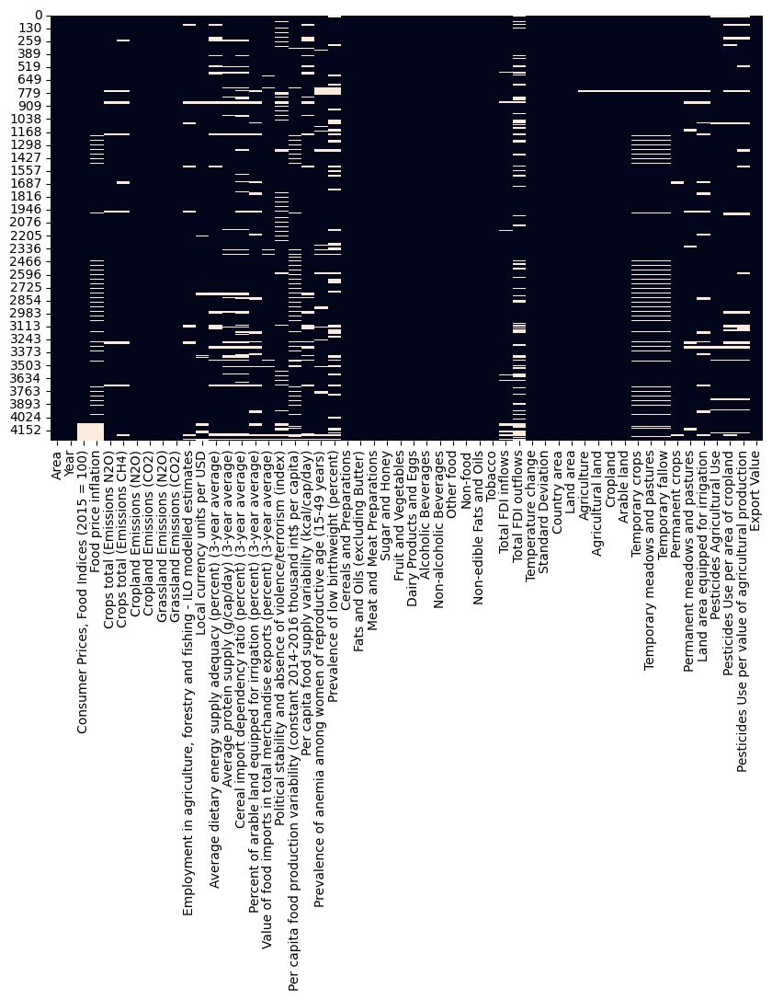

In [190]:
plt.figure(figsize=(10, 6))
sns.heatmap(data.isna(), cbar=False)

-----

# Step 3. Imputation

To impute the NaN values. Using the "most popular", median and mean has been considered. However, it's not only importart consider the trend in the feature in itself, but also the correlation of each feature with the other features. Involving these correlations, the preprocessing is more coherent, impacting highly positive to the inner patterns inside the data that the model can learn.

Below is shown the correlation of all the features. It is also the correlation with the label, which in this case can be ignored.

In [191]:
correlation_matrix = data.drop(["Year", "Area"], axis=1).corr()
spearman_corr = data.drop(["Year", "Area"], axis=1).corr(method='spearman')

### Identifying linear correlation among features (Pearson's correlation)

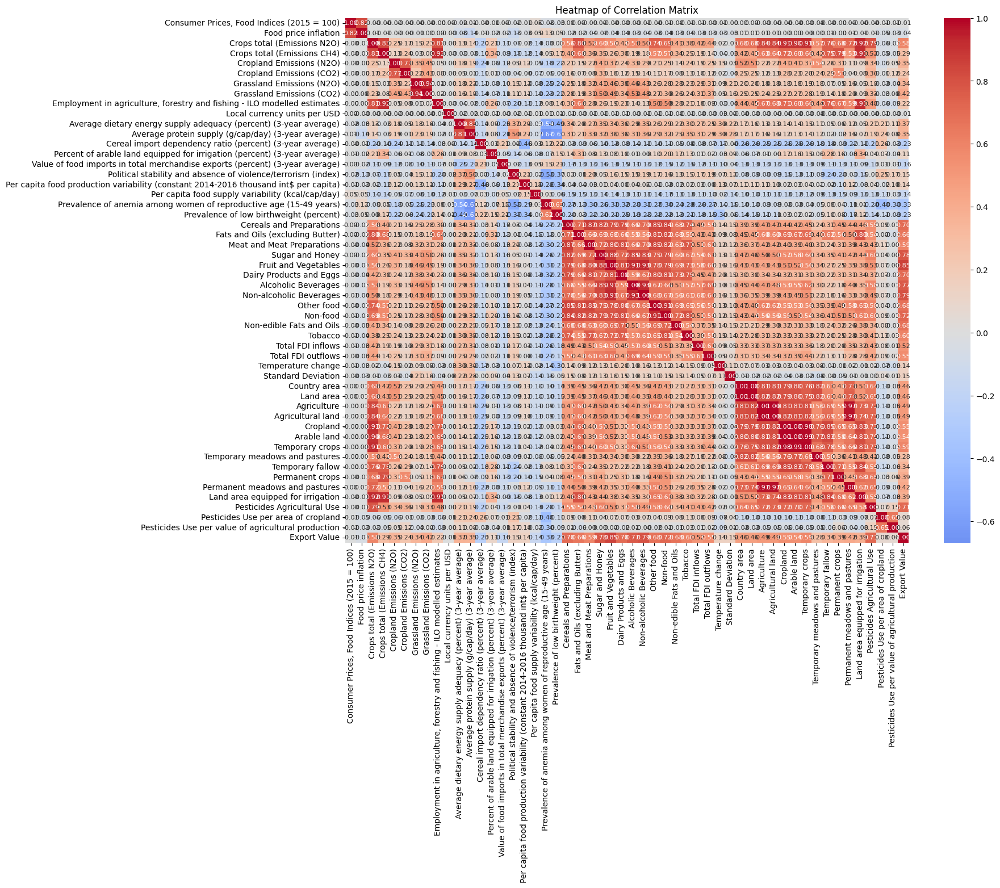

In [192]:
plt.figure(figsize=(16, 12))

sns.heatmap(correlation_matrix, annot=True, fmt=".2f",  cmap='coolwarm', center=0,
            annot_kws={"size": 8})
plt.title('Heatmap of Correlation Matrix')
plt.show()

### Identifying linear o non-linear correlation among features (Spearman's correlation)

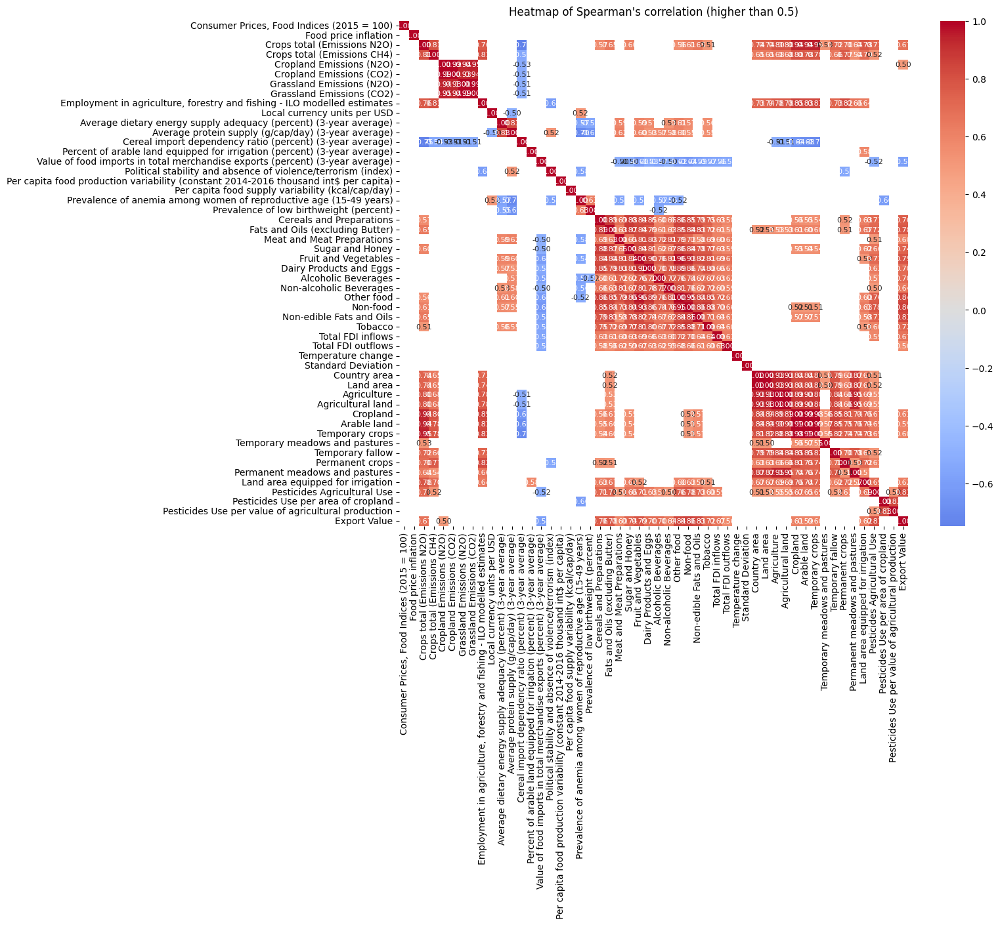

In [193]:
plt.figure(figsize=(12.5, 10))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', fmt=".2f", center=0,
            annot_kws={"size": 8}, mask=abs(spearman_corr) < 0.5)
plt.title("Heatmap of Spearman's correlation (higher than 0.5)")
plt.show()

### Contrasting Heatmaps (non-linear correlations)

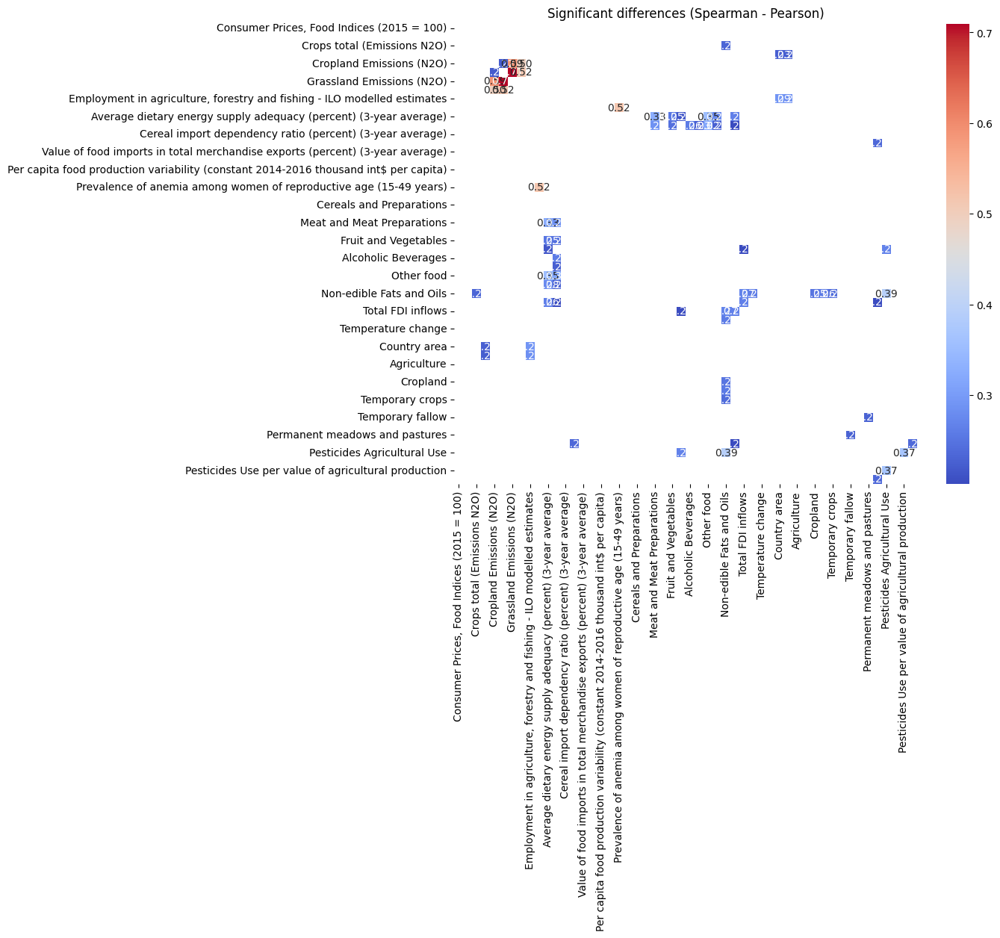

In [194]:
difference = spearman_corr - correlation_matrix

significant_diff = difference[(difference > 0.2) & (spearman_corr > 0.5)]

plt.figure(figsize=(10, 8))
sns.heatmap(significant_diff, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Significant differences (Spearman - Pearson)')
plt.show()

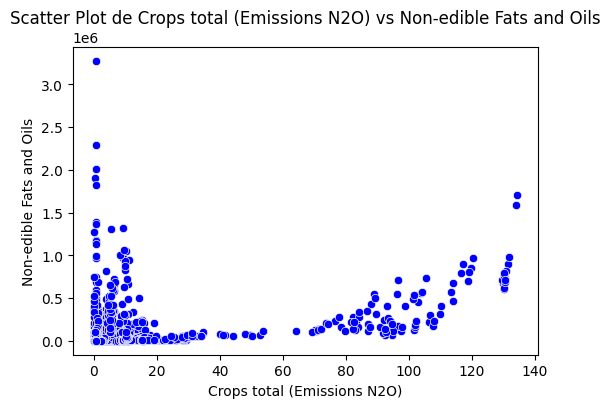

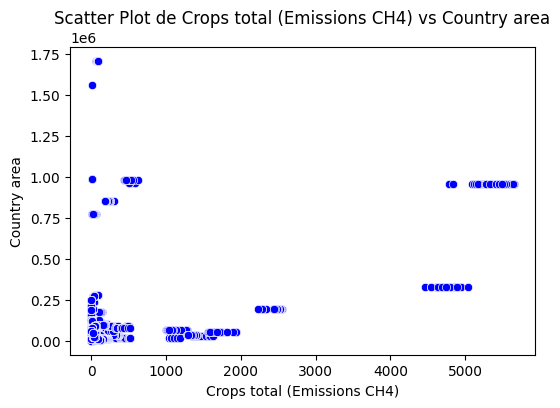

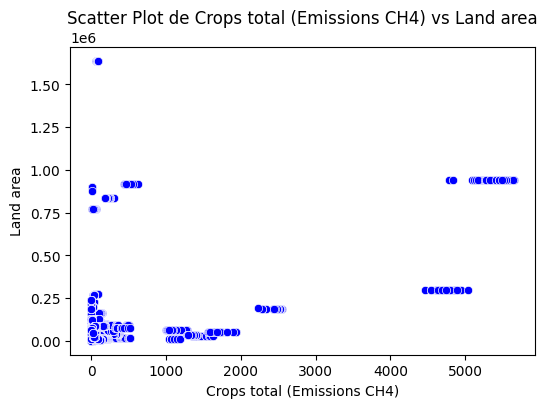

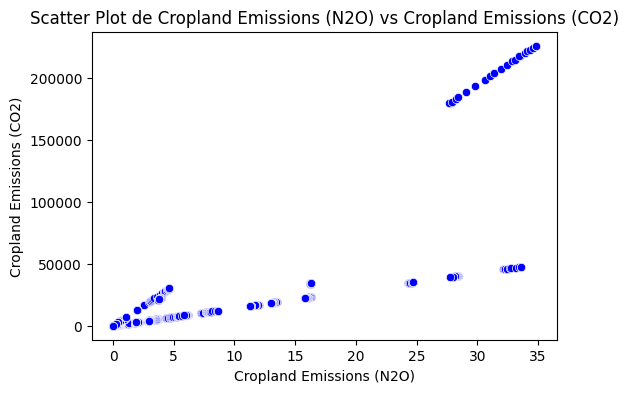

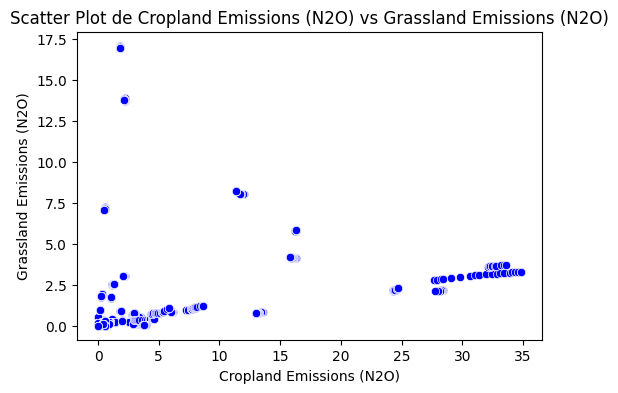

...

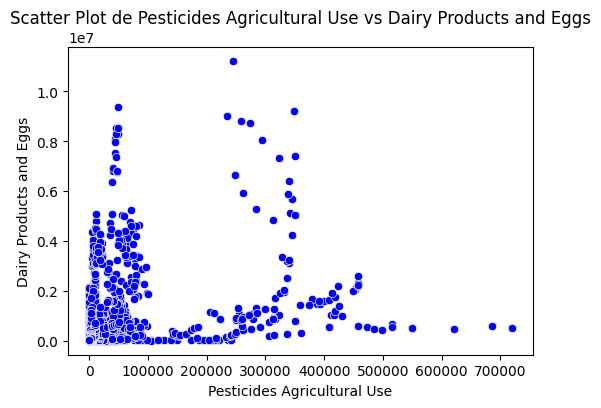

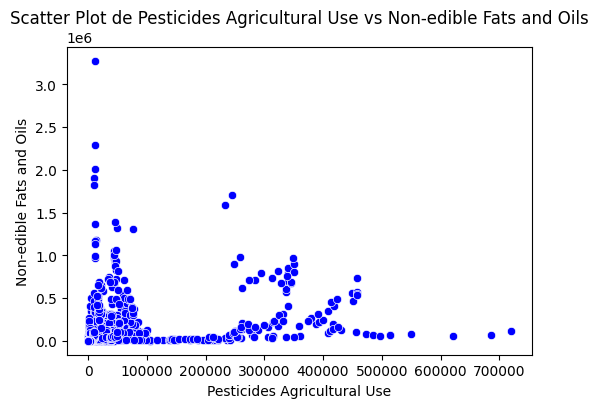

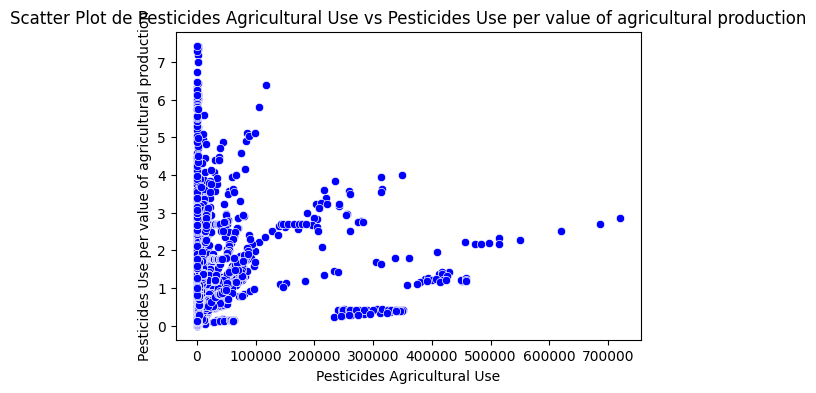

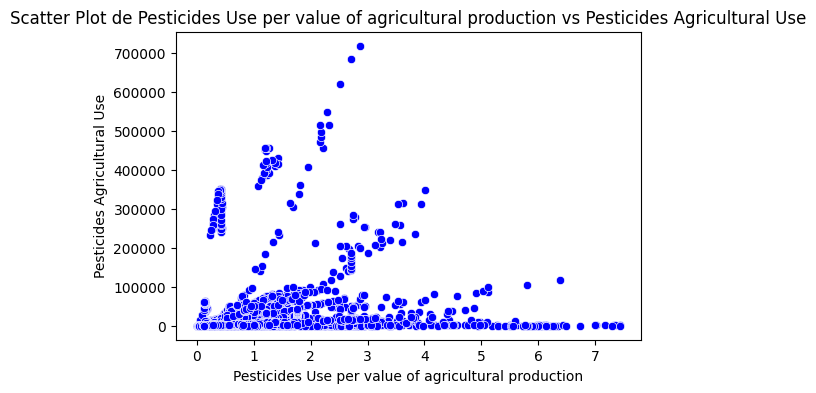

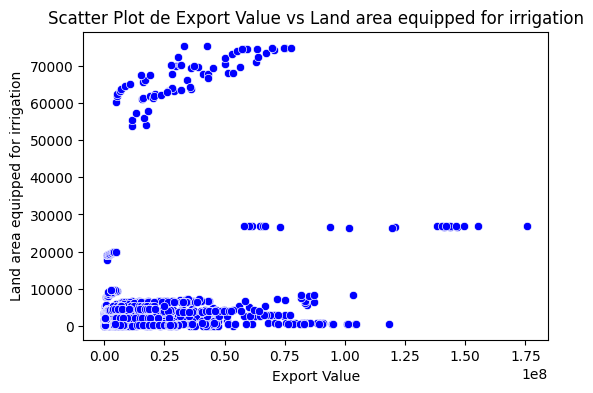

In [195]:
pairs_to_plot = significant_diff.stack().index.tolist()

for (var1, var2) in pairs_to_plot:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=data[var1], y=data[var2], color='blue') 
    plt.title(f'Scatter Plot de {var1} vs {var2}')
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.show()

Due to the potential non-linear correlations among features and their linear correlation, the approach will be based on using a predictive model to impute the NaN values in the features. There will be used "IterativeImputer" from sk-learn, creating two instance: one will impute the NaN values by means of a linear regression model and the other one with a polynomial model (second grade, as scatterplots shown above depicts parabolic relationships in some features.). Both imputes will be compared to preserve the one which gives the best results.

### Imputation implementation

##### Division of features and label

In [196]:
X = data.drop(columns=["Export Value", "Year", "Area"]) # features
y = data["Export Value"] # label

#### Linear Regression to impute NaN values

In [197]:
iterative_imputer_lr = IterativeImputer(estimator=LinearRegression(), max_iter=30, random_state=0)
X_imputed_lr = iterative_imputer_lr.fit_transform(X)

X_imputed_lr = pd.DataFrame(X_imputed_lr, columns=X.columns)

In [198]:
X_imputed_lr

,"Consumer Prices, Food Indices (2015 = 100)",Food price inflation,Crops total (Emissions N2O),Crops total (Emissions CH4),Cropland Emissions (N2O),Cropland Emissions (CO2),Grassland Emissions (N2O),Grassland Emissions (CO2),"Employment in agriculture, forestry and fishing - ILO modelled estimates",Local currency units per USD,...,Arable land,Temporary crops,Temporary meadows and pastures,Temporary fallow,Permanent crops,Permanent meadows and pastures,Land area equipped for irrigation,Pesticides Agricultural Use,Pesticides Use per area of cropland,Pesticides Use per value of agricultural production
0,3.195582e+02,211.958848,0.7056,20.8471,0.0000,0.0000,0.0000,0.0000,2765.950000,5.682909e+05,...,7683.0,5663.499694,942.235048,1077.256775,111.0,30000.0,3203.0,-12115.718905,0.536547,0.431016
1,3.587226e+02,153.368307,0.7054,19.2605,0.0000,0.0000,0.0000,0.0000,2805.540000,5.700002e+05,...,7683.0,2502.000000,0.000000,5181.000000,112.0,30000.0,3203.0,3688.577640,0.984998,0.766284
2,4.241387e+02,219.054193,1.0656,21.2553,0.0000,0.0000,0.0000,0.0000,2897.510000,4.778289e+04,...,7678.0,2111.000000,0.000000,5567.000000,112.0,30000.0,3208.0,8832.806996,0.455474,0.525313
3,4.824374e+02,169.226933,1.3117,23.7017,0.0000,0.0000,0.0000,0.0000,3093.270000,5.851530e+02,...,7772.0,3761.000000,0.000000,4011.000000,112.0,30000.0,3208.0,4031.480781,0.581572,0.518964
4,5.500867e+02,168.866060,1.0856,30.3089,0.0000,0.0000,0.0000,0.0000,3212.460000,5.741437e+02,...,7816.0,2934.000000,0.000000,4882.000000,112.0,30000.0,3208.0,2496.190005,0.531029,0.467642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4060,-1.237940e+10,348.097470,1.7465,1.3376,0.2409,1574.1040,1.8074,8097.2263,-269.752063,-3.174119e+07,...,19877.7,19172.100000,0.000000,705.600000,141.5,117227.0,1890.0,2862.470000,0.140000,0.320000
4061,-1.360678e+10,377.318360,2.3541,1.3382,0.2410,1574.3218,1.8067,8094.0807,1505.817964,3.956994e+07,...,19877.7,19172.100000,0.000000,705.600000,141.5,117227.0,1890.0,2862.470000,0.140000,0.290000
4062,1.139833e+09,119.058324,0.4705,28.0925,0.0000,0.0000,0.0000,0.0000,502.130000,3.594936e+07,...,1940.0,1480.681200,219.686500,239.632300,60.0,31838.0,1995.0,497.550000,0.250000,0.120000
4063,7.183320e+08,115.377029,0.5388,28.6679,0.0000,0.0000,0.0000,0.0000,490.400000,9.419418e+06,...,1940.0,1477.003600,219.320600,243.675800,60.0,31838.0,1995.0,497.550000,0.250000,0.120000


In [199]:
df_subset = X_imputed_lr.iloc[:10, :8]

dfi.export(df_subset, 'dataframe_subsetbbbb.png')

---

# Step 4. Scaling/Normalization

In [200]:
scaler = StandardScaler()
X_scaled_lr = scaler.fit_transform(X_imputed_lr)

In [201]:
X_scaled_lr

array([[-0.01541398,  0.29476354, -0.22629541, ..., -0.50251618,
        -0.6096465 , -0.54218138],
       [-0.01541398,  0.15093216, -0.2263086 , ..., -0.23205219,
        -0.52026943, -0.26678895],
       [-0.01541398,  0.31218159, -0.20254463, ..., -0.14401735,
        -0.62580458, -0.46472556],
       ...,
       [ 0.02357999,  0.06670607, -0.24180599, ..., -0.28666127,
        -0.66675598, -0.79765361],
       [ 0.00916033,  0.05766902, -0.23729994, ..., -0.28666127,
        -0.66675598, -0.79765361],
       [ 0.00446697,  0.04591222, -0.23493805, ..., -0.28666127,
        -0.66675598, -0.79765361]])

---

## Step 5. Principal Component Analysis (PCA)

#### With Linear Regression imputation data

##### With N = 2

In [202]:
pca_lr = PCA(n_components=2) 
data_pca_lr = pca_lr.fit_transform(X_scaled_lr)

data_pca_lr = pd.DataFrame(data_pca_lr, columns=['PC1', 'PC2'])

In [203]:
explained_variance_ratio = pca_lr.explained_variance_ratio_
print("\nVarianza explicada por cada componente principal:")
print(explained_variance_ratio)


Varianza explicada por cada componente principal:
[0.35232113 0.10802092]


In [204]:
cumulative_explained_variance = np.cumsum(explained_variance_ratio)
print("\nVarianza explicada acumulada por los componentes principales:")
print(cumulative_explained_variance)


Varianza explicada acumulada por los componentes principales:
[0.35232113 0.46034205]


----

##### With  N = 4

In [205]:
pca_lr_4 = PCA(n_components=4) 
data_pca_4 = pca_lr_4.fit_transform(X_scaled_lr)

data_pca_lr_4 = pd.DataFrame(data_pca_4, columns=['PC1', 'PC2','PC3', 'PC4'])

In [206]:
explained_variance_ratio_4 = pca_lr_4.explained_variance_ratio_
print("\nVarianza explicada por cada componente principal:")
print(explained_variance_ratio_4)


Varianza explicada por cada componente principal:
[0.35232113 0.10802092 0.09554465 0.0580666 ]


In [207]:
cumulative_explained_variance_4 = np.cumsum(explained_variance_ratio_4)
print("\nVarianza explicada acumulada por los componentes principales:")
print(cumulative_explained_variance_4)


Varianza explicada acumulada por los componentes principales:
[0.35232113 0.46034205 0.5558867  0.6139533 ]


---

##### With N = 21

The 95 % of the variance is explained by 21 components. This make sense since many of the feature show a high correlation among them, as shown in the Pearson's graph, but other features are not really redundant.

In [208]:
pca_lr_20 = PCA(n_components=21) 
data_pca_20 = pca_lr_20.fit_transform(X_scaled_lr)

data_pca_lr_20 = pd.DataFrame(data_pca_20, columns=['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8', 'PC9', 'PC10','PC11', 'PC12','PC13', 'PC14', 'PC15', 'PC16','PC17','PC18', 'PC19','PC20', 'PC21'])

In [209]:
explained_variance_ratio_20 = pca_lr_20.explained_variance_ratio_
print("\nVarianza explicada por cada componente principal:")
print(explained_variance_ratio_20)


Varianza explicada por cada componente principal:
[0.35232113 0.10802092 0.09554465 0.0580666  0.04442507 0.03880816
 0.03224002 0.02752125 0.02426579 0.0211603  0.01954213 0.01818883
 0.01732347 0.01510201 0.01500075 0.01280302 0.01130105 0.01051832
 0.00967415 0.00904479 0.0064491 ]


In [210]:
cumulative_explained_variance_20 = np.cumsum(explained_variance_ratio_20)
print("\nVarianza explicada acumulada por los componentes principales:")
print(cumulative_explained_variance_20)


Varianza explicada acumulada por los componentes principales:
[0.35232113 0.46034205 0.5558867  0.6139533  0.65837838 0.69718654
 0.72942656 0.75694782 0.78121361 0.80237391 0.82191604 0.84010487
 0.85742834 0.87253035 0.8875311  0.90033412 0.91163517 0.92215349
 0.93182764 0.94087244 0.94732154]


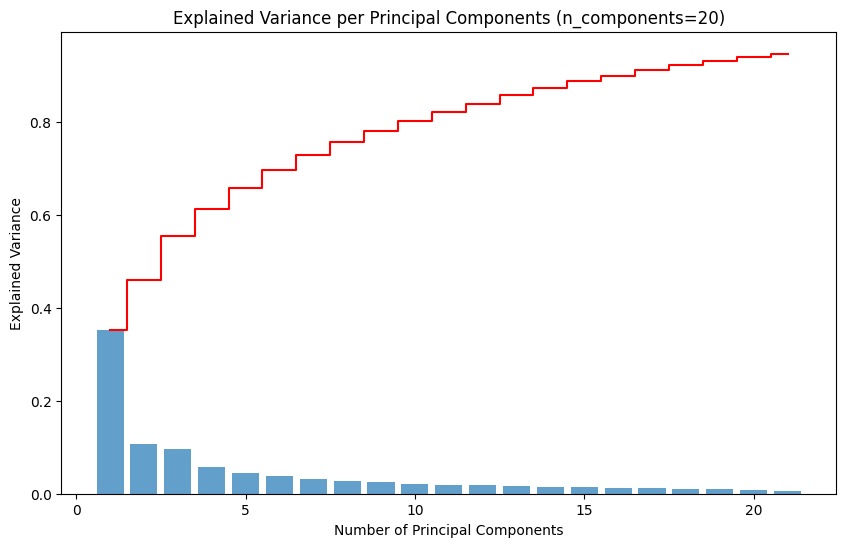

In [211]:
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio_20) + 1), explained_variance_ratio_20, alpha=0.7, align='center')
plt.step(range(1, len(cumulative_explained_variance_20) + 1), cumulative_explained_variance_20, where='mid', color='red')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance')
plt.title('Explained Variance per Principal Components (n_components=20)')
plt.show()

In [212]:
data_pca_lr_20

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21
0,-1.535470,1.291266,-0.750724,0.137767,-2.140453,-0.532105,0.482072,0.003985,0.892990,0.546892,...,-0.247900,-1.291669,0.422076,1.721716,0.053881,1.311841,0.217623,0.629382,-0.266941,-0.163095
1,-1.193337,1.322028,-0.956970,0.293982,-1.427180,-0.329722,0.153419,0.359914,0.681265,0.767288,...,-0.177942,-0.885591,0.646076,1.802006,0.528677,1.408871,0.195778,0.568810,-0.278624,-0.150657
2,-1.250720,1.384482,-1.011676,0.103265,-1.859349,-0.541525,-0.037952,0.062015,0.653630,0.098506,...,-0.271755,-1.294448,0.938818,2.166598,0.253052,1.610811,0.211288,0.787923,-0.715582,-0.335743
3,-1.292185,1.394197,-0.762238,0.123749,-1.816573,-0.489316,0.397511,0.163626,0.866577,-0.230243,...,-0.256376,-1.810189,-0.035361,1.568717,0.111732,0.832915,0.357256,0.689124,-0.471779,-0.235403
4,-1.171728,1.324854,-0.709230,0.087485,-1.804263,-0.427158,-0.215363,0.030753,0.862681,0.575133,...,0.200553,-1.121484,0.884044,1.476279,0.189927,1.094534,0.548797,0.669363,-0.467570,-0.222709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4060,0.680702,1.201759,-1.002030,-2.311797,-0.978394,-1.725958,0.347407,1.556588,-0.199243,0.676510,...,0.280065,-1.013329,1.767779,-0.994152,-0.113753,0.522188,0.830018,-0.877033,0.203099,-0.633597
4061,0.673209,1.633160,-1.255265,-2.069712,-1.686024,-1.537485,2.199790,1.458067,-0.133295,-0.636725,...,-0.257386,-1.669073,0.334090,-2.121898,-0.002457,-0.008376,0.074570,-0.702272,0.089192,-0.478313
4062,-1.217963,0.587038,-0.162856,-0.007914,-0.238238,-0.975524,-0.041432,-0.195577,-0.626927,-1.154121,...,-0.185028,0.436992,-0.581173,-1.073697,-0.586680,0.005875,-0.541381,-0.185482,0.364555,-0.029282
4063,-1.181120,0.490924,-0.143872,-0.031760,-0.195605,-0.857736,-0.516458,-0.304451,-0.549053,-0.072952,...,0.372379,1.119084,0.234180,-1.283629,-0.326595,0.329749,-0.485038,-0.284042,0.306609,-0.068869


In [213]:
df_subset = data_pca_lr_20.iloc[:10, :7]

dfi.export(df_subset, 'pca.png')

----

# Step 8. Divide data by subsets of training and test

In [214]:
target_countries = ['Mexico', 'Germany', 'Australia', 'Argentina'] 
years_to_extract = [2019, 2020, 2021]  

In [215]:
data_pca_lr_20['Year'] = data['Year'].values
data_pca_lr_20['Area'] = data['Area'].values

In [216]:
X_tested = data_pca_lr_20[(data_pca_lr_20['Area'].isin(target_countries)) & (data_pca_lr_20['Year'].isin(years_to_extract))]
X_tested_2021 = X_tested[X_tested['Year'] == 2021]
X_test = X_tested_2021.drop(columns=['Year', 'Area'])

In [217]:
X_trained = data_pca_lr_20[~((data_pca_lr_20['Area'].isin(target_countries)) & (data_pca_lr_20['Year'].isin(years_to_extract)))]
X_train = X_trained.drop(columns=['Year', 'Area'])

In [218]:
y_test = data[(data['Area'].isin(target_countries)) & (data['Year'] == 2021)]['Export Value'].values

In [219]:
data_filtered = data[~((data['Area'].isin(target_countries)) & (data['Year'].isin(years_to_extract)))]
y_train = data_filtered['Export Value'].values

### Scaling labels

In [220]:
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# Step 7. Machine Learning Model

### Training and finding best Hyperparameters with SearchGrid and Cross Validation

In [239]:
param_grid = {
    'hidden_layer_sizes': [(300, 300, 300)],
    'activation': ['relu'],
    'max_iter': [300],
    'alpha': [0.01,],
    'learning_rate_init': [0.001]
}
mlp = MLPRegressor(random_state=0)

grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=10)

grid_search.fit(X_train, y_train_scaled)

GridSearchCV(cv=3, estimator=MLPRegressor(random_state=0), n_jobs=10,
             param_grid={'activation': ['relu'], 'alpha': [0.01],
                         'hidden_layer_sizes': [(300, 300, 300)],
                         'learning_rate_init': [0.001], 'max_iter': [300]},
             scoring='neg_mean_squared_error')

In [240]:
print(f'Best MSE (negative): {-grid_search.best_score_:.4f}')
print(f'Best combination of hyperparameters: {grid_search.best_params_}')

Best MSE (negative): 0.2878
Best combination of hyperparameters: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (300, 300, 300), 'learning_rate_init': 0.001, 'max_iter': 300}


----

# Step 7. Evaluation

In [241]:
print("Total number of instances used:", len(data_pca_lr_20))
print("Number of instances used in the training:", len(X_train))
print("Number of instances used in the test:", len(y_test))

Total number of instances used: 4065
Number of instances used in the training: 4053
Number of instances used in the test: 4


In [242]:
def regression_report(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)

    
    report = (
        f'Mean Squared Error (MSE): {mse:.4f}\n'
        f'Root Mean Squared Error (RMSE): {rmse:.4f}\n'
        f'Mean Absolute Error (MAE): {mae:.4f}\n'
    )
    
    return report

In [243]:
best_mlp = grid_search.best_estimator_
y_pred_scaled = best_mlp.predict(X_test)

report = regression_report(y_test_scaled , y_pred_scaled)
print(report)

Mean Squared Error (MSE): 0.8620
Root Mean Squared Error (RMSE): 0.9284
Mean Absolute Error (MAE): 0.7887



In [244]:
comparison_scaled = pd.DataFrame({
    'Actual (scaled)': y_test_scaled,
    'Predicted (scaled)': y_pred_scaled
})

print(comparison_scaled )


   Actual (scaled)  Predicted (scaled)
0         2.062168            1.962347
1         2.378977            1.812582
2         5.437992            6.782730
3         2.137488            0.993462


In [245]:
y_pred_original = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()


comparison_original = pd.DataFrame({
    'Actual (scaled)': y_test,
    'Predicted (scaled)': y_pred_original
})

comparison_df_original_formatted = comparison_original.applymap(lambda x: f"{x:,.2f}")

print(comparison_df_original_formatted)

  Actual (scaled) Predicted (scaled)
0   38,143,627.59      36,588,334.37
1   43,079,750.56      34,254,890.92
2   90,741,554.61     111,693,601.14
3   39,317,163.59      21,492,370.50


In [246]:
results = pd.DataFrame({
    'id': target_countries,
    'year_prediction': "2021",
    'true_label': y_test,  
    'prediction': y_pred_original
})

results.to_csv('model_predictions.csv', index=False)